<a href="https://colab.research.google.com/github/Virajith26/CAPSTONE---Detecting-Breast-Cancer-using-NRL/blob/main/Capstone_with_TCGA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# IMPORTING PACKAGES

In [ ]:
pip install karateclub

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.5/64.5 kB 2.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 30.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 75.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.5/11.5 MB 68.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.5/172.5 kB 17.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 95.5 MB/s eta 0:00:00
  Created wheel for karateclub: filename=karateclub-1.3.3-py3-none-any.whl size=101986 sha256=46725f32450a85f666693983618036c78d9d4b6cc57997d1bc743f4c03e80dd9
  Stored in directory: /root/.cache/pip/wheels/62/bd/af/17e7ca6ba0ed144d22502780f5c0660a8e4985939dc6973a81
Successfully built karateclub
  Attempting uninstall: networkx
    Found existing installation: networkx 3.1
    Un

In [ ]:
pip install networkx==3.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 24.1 MB/s eta 0:00:00
  Attempting uninstall: networkx
    Found existing installation: networkx 2.6.3
    Uninstalling networkx-2.6.3:
      Successfully uninstalled networkx-2.6.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
karateclub 1.3.3 requires networkx<2.7, but you have networkx 3.0 which is incompatible.


In [ ]:
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, cross_val_score
import seaborn as sns
from karateclub.node_embedding.neighbourhood.grarep import GraRep
from karateclub.node_embedding.neighbourhood.deepwalk import DeepWalk

LOGISTIC REGRESSION AND METRICS:

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix,accuracy_score,roc_auc_score

DEEP NEURAL NETWORKS

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers

SVM

In [ ]:
from sklearn.svm import SVC

# Change gene names:

## Extracting Data from ZIP file

In [ ]:
!unzip /content/cancer_data.zip

Archive:  /content/cancer_data.zip
  inflating: cancer_data/tcga_brca_cancer.csv  
  inflating: cancer_data/tcga_brca_normal.csv  
  inflating: cancer_data/tcga_metadata.csv  


In [ ]:
df_cancer = pd.read_csv("cancer_data/tcga_brca_cancer.csv")
df_normal = pd.read_csv("cancer_data/tcga_brca_normal.csv")
#tcga = pd.read_csv("tcga_metadata.csv")

In [ ]:
ref_df = pd.read_csv("protein_coding.csv")

In [ ]:
ref_df

,Unnamed: 0,ensembl_gene_id,external_gene_name,transcript_biotype
0,1,ENSG00000198888,MT-ND1,protein_coding
1,2,ENSG00000198763,MT-ND2,protein_coding
2,3,ENSG00000198804,MT-CO1,protein_coding
3,4,ENSG00000198712,MT-CO2,protein_coding
4,5,ENSG00000228253,MT-ATP8,protein_coding
...,...,...,...,...
22513,22514,ENSG00000187017,ESPN,protein_coding
22514,22515,ENSG00000198216,CACNA1E,protein_coding
22515,22516,ENSG00000179930,ZNF648,protein_coding
22516,22517,ENSG00000162437,RAVER2,protein_coding


In [ ]:
gene_names = ref_df['ensembl_gene_id']
gene_names

0        ENSG00000198888
1        ENSG00000198763
2        ENSG00000198804
3        ENSG00000198712
4        ENSG00000228253
              ...       
22513    ENSG00000187017
22514    ENSG00000198216
22515    ENSG00000179930
22516    ENSG00000162437
22517    ENSG00000122432
Name: ensembl_gene_id, Length: 22518, dtype: object

In [ ]:
old_gene_names = df_cancer['Unnamed: 0']
old_gene_names

0        ENSG00000000003.14
1         ENSG00000000005.5
2        ENSG00000000419.12
3        ENSG00000000457.13
4        ENSG00000000460.16
                ...        
58032     ENSG00000283695.1
58033     ENSG00000283696.1
58034     ENSG00000283697.1
58035     ENSG00000283698.1
58036     ENSG00000283699.1
Name: Unnamed: 0, Length: 58037, dtype: object

In [ ]:
(old_gene_names == df_normal['Unnamed: 0']).value_counts()

True    58037
Name: Unnamed: 0, dtype: int64

In [ ]:
old_gene_names_changed = []
for i in old_gene_names:
  name,extra = i.split('.')
  old_gene_names_changed.append(name)

In [ ]:
len(old_gene_names_changed)

58037

In [ ]:
df_cancer['Unnamed: 0'] = old_gene_names_changed
df_cancer

,Unnamed: 0,1AB92ADA-637E-4A42-A39A-70CEEEA41AE3,DA98A67C-F11F-41D3-8223-1161EBFF8B58,06CCFD0F-7FB8-471E-B823-C7876582D6FC,A33B2F42-6EC6-4FB2-8BE5-542407A0382E,CC4C52A7-57D4-4959-ABFB-8ED3B1BA4DED,D021A258-8713-4383-9DCA-45E2F54A0411,C705FA90-D9AA-4949-BACA-1C022A14CB03,85380A2D-9951-4D4B-A2A4-6F5F2AFC54E3,F53A9C63-1AF7-4CBC-B8B7-4AA7AAED3364,...,8157C85F-D313-4102-B682-D9C38713BF07,BF128355-3E49-449D-A503-00E678E90DF8,D7FF2E3A-5472-4413-8C28-0CD76E3C2FFC,CA308E28-E476-4E9D-8E0D-7EBA884C4693,049DD36F-6E0F-4693-A8FA-5F4042156612,E65D0B66-B1D6-40E2-916E-990522AD7E7B,3D648FD2-3148-478B-A74C-0016A04CDBE5,1542ED64-4A8C-44D2-AA6B-712B4145A1FD,B38CE2EB-7610-45C6-A83E-BBC16A341F79,933EA2AC-B473-40CD-BA4B-E8EA5C3DEA92
0,ENSG00000000003,601,2756,1960,1194,1357,310,1594,2201,475,...,1497,848,1375,3452,489,1084,664,1459,2426,1850
1,ENSG00000000005,3,398,1,0,53,7,7,4,11,...,21,11,1,27,34,12,0,4,13,5
2,ENSG00000000419,1181,776,1363,3587,757,138,790,947,2272,...,810,2536,1912,956,872,760,1162,1012,1094,1390
3,ENSG00000000457,1622,940,879,1792,976,784,1806,2380,1164,...,1983,1965,1574,1833,2010,691,649,2609,1311,1358
4,ENSG00000000460,711,472,554,1197,494,407,811,1175,1010,...,893,1260,1854,1021,1158,347,313,1035,733,1140
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58032,ENSG00000283695,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
58033,ENSG00000283696,13,23,8,20,27,6,8,39,36,...,31,24,33,29,56,11,8,25,19,15
58034,ENSG00000283697,59,26,91,20,40,51,113,276,86,...,37,29,47,46,47,52,38,27,67,46
58035,ENSG00000283698,1,0,0,0,0,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0


In [ ]:
df_normal['Unnamed: 0'] = old_gene_names_changed
df_normal

,Unnamed: 0,2E63B18E-FDC1-414C-9291-492D3D380232,F5303C4B-7008-44AF-8D22-0BA38750DEA2,16B2F770-0357-4DE9-B0BF-7C546B169042,4113BB01-8676-40B1-AD48-D31462D6EA3C,29F2019D-5A69-497E-A7FF-73DD35FCAA01,5CC8AC1B-C01C-4AD0-940A-5864F1229180,F3FD3DEE-DD68-4E91-8C94-4593C582CBA0,835FA52A-5D99-452A-96BA-500BE953B086,6751836C-0B02-4C38-A5F4-006E15050A9B,...,49B4CDAD-26FB-4B62-AEA7-7DB13F13C389,A5572139-03CA-4299-98B6-13A2945649D0,B0C3D4F5-D82B-468A-9D62-A9B6CA5533B8,635263E8-C2CA-497E-A55F-1F938F22B7AA,68F89489-0460-4E20-B878-7C432907BAFC,572D8E48-AD79-4A97-97E6-5298DB50E8E3,BA1D9BF5-F4AB-40B0-8E2F-FE406AFCC77E,94F26F8F-A223-4B19-95F0-9937134B8F32,F13C65EC-EC32-4AD8-A79E-F517071DBA63,75F1E6B3-B296-49AE-B065-B4E39A986790
0,ENSG00000000003,2340,2201,323,1986,1684,4730,1724,2196,4289,...,955,2469,3627,1338,1060,3707,816,2267,3736,950
1,ENSG00000000005,523,5,2,394,33,88,34,933,127,...,58,368,339,3,9,267,10,43,102,1
2,ENSG00000000419,834,797,1413,820,935,927,1238,828,1083,...,909,909,1585,1356,1295,860,1126,767,796,1242
3,ENSG00000000457,855,1465,1054,634,1822,1466,1315,418,1551,...,1008,919,1189,3845,1604,1278,963,1229,1296,1525
4,ENSG00000000460,371,781,632,265,893,581,1104,207,625,...,522,454,654,2223,872,507,600,604,507,717
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58032,ENSG00000283695,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
58033,ENSG00000283696,27,36,3,13,55,29,7,12,22,...,13,28,22,45,5,19,26,20,19,8
58034,ENSG00000283697,36,71,73,32,97,68,51,28,60,...,54,40,49,30,54,51,48,20,41,96
58035,ENSG00000283698,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


## Removing unnecessary gene names with no gene expression data

In [ ]:
mod_gene_names = []
for i in gene_names:
  if i in old_gene_names_changed:
   mod_gene_names.append(i)#in_df+=1
    #out_df+=1

In [ ]:
len(mod_gene_names)

19382

In [ ]:
mod_gene_names

In [ ]:
print(in_df, " ",out_df)

19382   3136


## Dropping columns and saving the dataset

In [ ]:
mod_df_cancer = df_cancer[df_cancer['Unnamed: 0'].isin(mod_gene_names)]
mod_df_cancer

,Unnamed: 0,1AB92ADA-637E-4A42-A39A-70CEEEA41AE3,DA98A67C-F11F-41D3-8223-1161EBFF8B58,06CCFD0F-7FB8-471E-B823-C7876582D6FC,A33B2F42-6EC6-4FB2-8BE5-542407A0382E,CC4C52A7-57D4-4959-ABFB-8ED3B1BA4DED,D021A258-8713-4383-9DCA-45E2F54A0411,C705FA90-D9AA-4949-BACA-1C022A14CB03,85380A2D-9951-4D4B-A2A4-6F5F2AFC54E3,F53A9C63-1AF7-4CBC-B8B7-4AA7AAED3364,...,8157C85F-D313-4102-B682-D9C38713BF07,BF128355-3E49-449D-A503-00E678E90DF8,D7FF2E3A-5472-4413-8C28-0CD76E3C2FFC,CA308E28-E476-4E9D-8E0D-7EBA884C4693,049DD36F-6E0F-4693-A8FA-5F4042156612,E65D0B66-B1D6-40E2-916E-990522AD7E7B,3D648FD2-3148-478B-A74C-0016A04CDBE5,1542ED64-4A8C-44D2-AA6B-712B4145A1FD,B38CE2EB-7610-45C6-A83E-BBC16A341F79,933EA2AC-B473-40CD-BA4B-E8EA5C3DEA92
0,ENSG00000000003,601,2756,1960,1194,1357,310,1594,2201,475,...,1497,848,1375,3452,489,1084,664,1459,2426,1850
1,ENSG00000000005,3,398,1,0,53,7,7,4,11,...,21,11,1,27,34,12,0,4,13,5
2,ENSG00000000419,1181,776,1363,3587,757,138,790,947,2272,...,810,2536,1912,956,872,760,1162,1012,1094,1390
3,ENSG00000000457,1622,940,879,1792,976,784,1806,2380,1164,...,1983,1965,1574,1833,2010,691,649,2609,1311,1358
4,ENSG00000000460,711,472,554,1197,494,407,811,1175,1010,...,893,1260,1854,1021,1158,347,313,1035,733,1140
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57985,ENSG00000283632,202,32,138,67,208,7,19,63,167,...,172,85,44,255,372,210,550,134,223,131
57993,ENSG00000283644,0,0,0,0,0,4,1,0,0,...,0,0,0,0,0,0,1,0,0,1
58000,ENSG00000283654,23,15,22,12,20,7,14,17,9,...,21,5,9,22,12,19,13,12,23,14
58021,ENSG00000283683,0,3,1,1,4,0,1,1,1,...,0,1,0,1,2,1,2,1,2,0


In [ ]:
mod_df_normal = df_normal[df_normal['Unnamed: 0'].isin(mod_gene_names)]
mod_df_normal

,Unnamed: 0,2E63B18E-FDC1-414C-9291-492D3D380232,F5303C4B-7008-44AF-8D22-0BA38750DEA2,16B2F770-0357-4DE9-B0BF-7C546B169042,4113BB01-8676-40B1-AD48-D31462D6EA3C,29F2019D-5A69-497E-A7FF-73DD35FCAA01,5CC8AC1B-C01C-4AD0-940A-5864F1229180,F3FD3DEE-DD68-4E91-8C94-4593C582CBA0,835FA52A-5D99-452A-96BA-500BE953B086,6751836C-0B02-4C38-A5F4-006E15050A9B,...,49B4CDAD-26FB-4B62-AEA7-7DB13F13C389,A5572139-03CA-4299-98B6-13A2945649D0,B0C3D4F5-D82B-468A-9D62-A9B6CA5533B8,635263E8-C2CA-497E-A55F-1F938F22B7AA,68F89489-0460-4E20-B878-7C432907BAFC,572D8E48-AD79-4A97-97E6-5298DB50E8E3,BA1D9BF5-F4AB-40B0-8E2F-FE406AFCC77E,94F26F8F-A223-4B19-95F0-9937134B8F32,F13C65EC-EC32-4AD8-A79E-F517071DBA63,75F1E6B3-B296-49AE-B065-B4E39A986790
0,ENSG00000000003,2340,2201,323,1986,1684,4730,1724,2196,4289,...,955,2469,3627,1338,1060,3707,816,2267,3736,950
1,ENSG00000000005,523,5,2,394,33,88,34,933,127,...,58,368,339,3,9,267,10,43,102,1
2,ENSG00000000419,834,797,1413,820,935,927,1238,828,1083,...,909,909,1585,1356,1295,860,1126,767,796,1242
3,ENSG00000000457,855,1465,1054,634,1822,1466,1315,418,1551,...,1008,919,1189,3845,1604,1278,963,1229,1296,1525
4,ENSG00000000460,371,781,632,265,893,581,1104,207,625,...,522,454,654,2223,872,507,600,604,507,717
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57985,ENSG00000283632,85,247,77,131,216,48,81,236,92,...,110,86,26,94,64,101,166,108,102,168
57993,ENSG00000283644,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
58000,ENSG00000283654,18,17,44,17,23,21,13,9,10,...,17,14,16,13,10,14,27,15,15,12
58021,ENSG00000283683,81,0,1,157,0,2,0,364,22,...,0,5,14,0,2,4,3,0,1,0


In [ ]:
mod_df_cancer = mod_df_cancer.reset_index()
mod_df_normal = mod_df_normal.reset_index()

In [ ]:
mod_df_cancer = mod_df_cancer.drop(['index'],axis=1)
mod_df_normal = mod_df_normal.drop(['index'],axis=1)

In [ ]:
mod_df_cancer

,Unnamed: 0,1AB92ADA-637E-4A42-A39A-70CEEEA41AE3,DA98A67C-F11F-41D3-8223-1161EBFF8B58,06CCFD0F-7FB8-471E-B823-C7876582D6FC,A33B2F42-6EC6-4FB2-8BE5-542407A0382E,CC4C52A7-57D4-4959-ABFB-8ED3B1BA4DED,D021A258-8713-4383-9DCA-45E2F54A0411,C705FA90-D9AA-4949-BACA-1C022A14CB03,85380A2D-9951-4D4B-A2A4-6F5F2AFC54E3,F53A9C63-1AF7-4CBC-B8B7-4AA7AAED3364,...,8157C85F-D313-4102-B682-D9C38713BF07,BF128355-3E49-449D-A503-00E678E90DF8,D7FF2E3A-5472-4413-8C28-0CD76E3C2FFC,CA308E28-E476-4E9D-8E0D-7EBA884C4693,049DD36F-6E0F-4693-A8FA-5F4042156612,E65D0B66-B1D6-40E2-916E-990522AD7E7B,3D648FD2-3148-478B-A74C-0016A04CDBE5,1542ED64-4A8C-44D2-AA6B-712B4145A1FD,B38CE2EB-7610-45C6-A83E-BBC16A341F79,933EA2AC-B473-40CD-BA4B-E8EA5C3DEA92
0,ENSG00000000003,601,2756,1960,1194,1357,310,1594,2201,475,...,1497,848,1375,3452,489,1084,664,1459,2426,1850
1,ENSG00000000005,3,398,1,0,53,7,7,4,11,...,21,11,1,27,34,12,0,4,13,5
2,ENSG00000000419,1181,776,1363,3587,757,138,790,947,2272,...,810,2536,1912,956,872,760,1162,1012,1094,1390
3,ENSG00000000457,1622,940,879,1792,976,784,1806,2380,1164,...,1983,1965,1574,1833,2010,691,649,2609,1311,1358
4,ENSG00000000460,711,472,554,1197,494,407,811,1175,1010,...,893,1260,1854,1021,1158,347,313,1035,733,1140
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19396,ENSG00000283632,202,32,138,67,208,7,19,63,167,...,172,85,44,255,372,210,550,134,223,131
19397,ENSG00000283644,0,0,0,0,0,4,1,0,0,...,0,0,0,0,0,0,1,0,0,1
19398,ENSG00000283654,23,15,22,12,20,7,14,17,9,...,21,5,9,22,12,19,13,12,23,14
19399,ENSG00000283683,0,3,1,1,4,0,1,1,1,...,0,1,0,1,2,1,2,1,2,0


In [ ]:
mod_df_normal

,Unnamed: 0,2E63B18E-FDC1-414C-9291-492D3D380232,F5303C4B-7008-44AF-8D22-0BA38750DEA2,16B2F770-0357-4DE9-B0BF-7C546B169042,4113BB01-8676-40B1-AD48-D31462D6EA3C,29F2019D-5A69-497E-A7FF-73DD35FCAA01,5CC8AC1B-C01C-4AD0-940A-5864F1229180,F3FD3DEE-DD68-4E91-8C94-4593C582CBA0,835FA52A-5D99-452A-96BA-500BE953B086,6751836C-0B02-4C38-A5F4-006E15050A9B,...,49B4CDAD-26FB-4B62-AEA7-7DB13F13C389,A5572139-03CA-4299-98B6-13A2945649D0,B0C3D4F5-D82B-468A-9D62-A9B6CA5533B8,635263E8-C2CA-497E-A55F-1F938F22B7AA,68F89489-0460-4E20-B878-7C432907BAFC,572D8E48-AD79-4A97-97E6-5298DB50E8E3,BA1D9BF5-F4AB-40B0-8E2F-FE406AFCC77E,94F26F8F-A223-4B19-95F0-9937134B8F32,F13C65EC-EC32-4AD8-A79E-F517071DBA63,75F1E6B3-B296-49AE-B065-B4E39A986790
0,ENSG00000000003,2340,2201,323,1986,1684,4730,1724,2196,4289,...,955,2469,3627,1338,1060,3707,816,2267,3736,950
1,ENSG00000000005,523,5,2,394,33,88,34,933,127,...,58,368,339,3,9,267,10,43,102,1
2,ENSG00000000419,834,797,1413,820,935,927,1238,828,1083,...,909,909,1585,1356,1295,860,1126,767,796,1242
3,ENSG00000000457,855,1465,1054,634,1822,1466,1315,418,1551,...,1008,919,1189,3845,1604,1278,963,1229,1296,1525
4,ENSG00000000460,371,781,632,265,893,581,1104,207,625,...,522,454,654,2223,872,507,600,604,507,717
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19396,ENSG00000283632,85,247,77,131,216,48,81,236,92,...,110,86,26,94,64,101,166,108,102,168
19397,ENSG00000283644,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
19398,ENSG00000283654,18,17,44,17,23,21,13,9,10,...,17,14,16,13,10,14,27,15,15,12
19399,ENSG00000283683,81,0,1,157,0,2,0,364,22,...,0,5,14,0,2,4,3,0,1,0


In [ ]:
mod_df_cancer = mod_df_cancer.transpose()
mod_df_normal = mod_df_normal.transpose()

In [ ]:
col_cancer = list(mod_df_cancer.iloc[0,:])
col_normal = list(mod_df_normal.iloc[0,:])

In [ ]:
mod_df_cancer.columns = col_cancer
mod_df_normal.columns = col_normal

In [ ]:
mod_df_cancer = mod_df_cancer.drop(['Unnamed: 0'],axis= 0)
mod_df_normal = mod_df_normal.drop(['Unnamed: 0'],axis = 0)

In [ ]:
mod_df_cancer = mod_df_cancer.reset_index()
mod_df_normal = mod_df_normal.reset_index()

In [ ]:
mod_df_cancer = mod_df_cancer.drop(['index'],axis=1)
mod_df_normal = mod_df_normal.drop(['index'],axis=1)

In [ ]:
mod_df_cancer

,ENSG00000000003,ENSG00000000005,ENSG00000000419,ENSG00000000457,ENSG00000000460,ENSG00000000938,ENSG00000000971,ENSG00000001036,ENSG00000001084,ENSG00000001167,...,ENSG00000283528,ENSG00000283536,ENSG00000283567,ENSG00000283594,ENSG00000283599,ENSG00000283632,ENSG00000283644,ENSG00000283654,ENSG00000283683,ENSG00000283697
0,601,3,1181,1622,711,228,970,2038,3150,1815,...,132,0,0,0,3,202,0,23,0,59
1,2756,398,776,940,472,71,6385,889,1123,1708,...,114,0,0,0,0,32,0,15,3,26
2,1960,1,1363,879,554,158,858,2222,611,985,...,60,0,1,0,1,138,0,22,1,91
3,1194,0,3587,1792,1197,191,1782,21703,1217,950,...,41,0,1,0,8,67,0,12,1,20
4,1357,53,757,976,494,2495,2782,1945,1348,1031,...,115,0,0,0,30,208,0,20,4,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1048,1084,12,760,691,347,229,2105,1693,668,1141,...,45,0,0,0,0,210,0,19,1,52
1049,664,0,1162,649,313,227,424,3392,966,1481,...,20,0,0,0,0,550,1,13,2,38
1050,1459,4,1012,2609,1035,491,1008,3032,789,1068,...,67,0,0,0,1,134,0,12,1,27
1051,2426,13,1094,1311,733,202,4183,3243,1047,2491,...,65,1,0,0,3,223,0,23,2,67


In [ ]:
mod_df_normal

,ENSG00000000003,ENSG00000000005,ENSG00000000419,ENSG00000000457,ENSG00000000460,ENSG00000000938,ENSG00000000971,ENSG00000001036,ENSG00000001084,ENSG00000001167,...,ENSG00000283528,ENSG00000283536,ENSG00000283567,ENSG00000283594,ENSG00000283599,ENSG00000283632,ENSG00000283644,ENSG00000283654,ENSG00000283683,ENSG00000283697
0,2340,523,834,855,371,372,9125,2170,1320,960,...,108,1,0,0,0,85,0,18,81,36
1,2201,5,797,1465,781,424,1952,1828,1692,1398,...,216,1,0,0,0,247,0,17,0,71
2,323,2,1413,1054,632,118,1825,3785,2291,3340,...,145,1,0,0,154,77,0,44,1,73
3,1986,394,820,634,265,341,7880,1962,1897,828,...,72,1,0,0,0,131,0,17,157,32
4,1684,33,935,1822,893,350,2406,2656,1090,1670,...,179,0,0,0,1,216,1,23,0,97
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
230,3707,267,860,1278,507,230,7933,1546,1827,1564,...,207,0,0,1,1,101,0,14,4,51
231,816,10,1126,963,600,245,2925,1067,954,1683,...,84,2,0,0,0,166,0,27,3,48
232,2267,43,767,1229,604,300,1446,1905,1340,1434,...,429,0,0,2,1,108,0,15,0,20
233,3736,102,796,1296,507,108,883,1328,1288,1667,...,380,0,0,2,0,102,0,15,1,41


In [ ]:
mod_df_cancer.to_csv('cancer_csv_modified.csv')
mod_df_normal.to_csv('normal_csv_modified.csv')

In [ ]:
from google.colab import files
files.download('cancer_csv_modified.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Extracting the Data

In [ ]:
df_c = pd.read_csv("cancer_csv_modified.csv")
df_c = df_c.drop(['Unnamed: 0'],axis=1)
df_c

,ENSG00000000003,ENSG00000000005,ENSG00000000419,ENSG00000000457,ENSG00000000460,ENSG00000000938,ENSG00000000971,ENSG00000001036,ENSG00000001084,ENSG00000001167,...,ENSG00000283528,ENSG00000283536,ENSG00000283567,ENSG00000283594,ENSG00000283599,ENSG00000283632,ENSG00000283644,ENSG00000283654,ENSG00000283683,ENSG00000283697
0,601,3,1181,1622,711,228,970,2038,3150,1815,...,132,0,0,0,3,202,0,23,0,59
1,2756,398,776,940,472,71,6385,889,1123,1708,...,114,0,0,0,0,32,0,15,3,26
2,1960,1,1363,879,554,158,858,2222,611,985,...,60,0,1,0,1,138,0,22,1,91
3,1194,0,3587,1792,1197,191,1782,21703,1217,950,...,41,0,1,0,8,67,0,12,1,20
4,1357,53,757,976,494,2495,2782,1945,1348,1031,...,115,0,0,0,30,208,0,20,4,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1048,1084,12,760,691,347,229,2105,1693,668,1141,...,45,0,0,0,0,210,0,19,1,52
1049,664,0,1162,649,313,227,424,3392,966,1481,...,20,0,0,0,0,550,1,13,2,38
1050,1459,4,1012,2609,1035,491,1008,3032,789,1068,...,67,0,0,0,1,134,0,12,1,27
1051,2426,13,1094,1311,733,202,4183,3243,1047,2491,...,65,1,0,0,3,223,0,23,2,67


In [ ]:
df_n = pd.read_csv("normal_csv_modified.csv")
df_n = df_n.drop(['Unnamed: 0'],axis=1)
df_n

,ENSG00000000003,ENSG00000000005,ENSG00000000419,ENSG00000000457,ENSG00000000460,ENSG00000000938,ENSG00000000971,ENSG00000001036,ENSG00000001084,ENSG00000001167,...,ENSG00000283528,ENSG00000283536,ENSG00000283567,ENSG00000283594,ENSG00000283599,ENSG00000283632,ENSG00000283644,ENSG00000283654,ENSG00000283683,ENSG00000283697
0,2340,523,834,855,371,372,9125,2170,1320,960,...,108,1,0,0,0,85,0,18,81,36
1,2201,5,797,1465,781,424,1952,1828,1692,1398,...,216,1,0,0,0,247,0,17,0,71
2,323,2,1413,1054,632,118,1825,3785,2291,3340,...,145,1,0,0,154,77,0,44,1,73
3,1986,394,820,634,265,341,7880,1962,1897,828,...,72,1,0,0,0,131,0,17,157,32
4,1684,33,935,1822,893,350,2406,2656,1090,1670,...,179,0,0,0,1,216,1,23,0,97
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
230,3707,267,860,1278,507,230,7933,1546,1827,1564,...,207,0,0,1,1,101,0,14,4,51
231,816,10,1126,963,600,245,2925,1067,954,1683,...,84,2,0,0,0,166,0,27,3,48
232,2267,43,767,1229,604,300,1446,1905,1340,1434,...,429,0,0,2,1,108,0,15,0,20
233,3736,102,796,1296,507,108,883,1328,1288,1667,...,380,0,0,2,0,102,0,15,1,41


# Performing benchmark Machine Learning Model

You would Need cancer_csv_modified and normal_csv_modified dataset

In [ ]:
def_df_c = df_c.copy()
def_df_c['target'] = 1
def_df_c

,ENSG00000000003,ENSG00000000005,ENSG00000000419,ENSG00000000457,ENSG00000000460,ENSG00000000938,ENSG00000000971,ENSG00000001036,ENSG00000001084,ENSG00000001167,...,ENSG00000283536,ENSG00000283567,ENSG00000283594,ENSG00000283599,ENSG00000283632,ENSG00000283644,ENSG00000283654,ENSG00000283683,ENSG00000283697,target
0,601,3,1181,1622,711,228,970,2038,3150,1815,...,0,0,0,3,202,0,23,0,59,1
1,2756,398,776,940,472,71,6385,889,1123,1708,...,0,0,0,0,32,0,15,3,26,1
2,1960,1,1363,879,554,158,858,2222,611,985,...,0,1,0,1,138,0,22,1,91,1
3,1194,0,3587,1792,1197,191,1782,21703,1217,950,...,0,1,0,8,67,0,12,1,20,1
4,1357,53,757,976,494,2495,2782,1945,1348,1031,...,0,0,0,30,208,0,20,4,40,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1048,1084,12,760,691,347,229,2105,1693,668,1141,...,0,0,0,0,210,0,19,1,52,1
1049,664,0,1162,649,313,227,424,3392,966,1481,...,0,0,0,0,550,1,13,2,38,1
1050,1459,4,1012,2609,1035,491,1008,3032,789,1068,...,0,0,0,1,134,0,12,1,27,1
1051,2426,13,1094,1311,733,202,4183,3243,1047,2491,...,1,0,0,3,223,0,23,2,67,1


In [ ]:
def_df_n = df_n.copy()
def_df_n['target'] = 0
def_df_n

,ENSG00000000003,ENSG00000000005,ENSG00000000419,ENSG00000000457,ENSG00000000460,ENSG00000000938,ENSG00000000971,ENSG00000001036,ENSG00000001084,ENSG00000001167,...,ENSG00000283536,ENSG00000283567,ENSG00000283594,ENSG00000283599,ENSG00000283632,ENSG00000283644,ENSG00000283654,ENSG00000283683,ENSG00000283697,target
0,2340,523,834,855,371,372,9125,2170,1320,960,...,1,0,0,0,85,0,18,81,36,0
1,2201,5,797,1465,781,424,1952,1828,1692,1398,...,1,0,0,0,247,0,17,0,71,0
2,323,2,1413,1054,632,118,1825,3785,2291,3340,...,1,0,0,154,77,0,44,1,73,0
3,1986,394,820,634,265,341,7880,1962,1897,828,...,1,0,0,0,131,0,17,157,32,0
4,1684,33,935,1822,893,350,2406,2656,1090,1670,...,0,0,0,1,216,1,23,0,97,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
230,3707,267,860,1278,507,230,7933,1546,1827,1564,...,0,0,1,1,101,0,14,4,51,0
231,816,10,1126,963,600,245,2925,1067,954,1683,...,2,0,0,0,166,0,27,3,48,0
232,2267,43,767,1229,604,300,1446,1905,1340,1434,...,0,0,2,1,108,0,15,0,20,0
233,3736,102,796,1296,507,108,883,1328,1288,1667,...,0,0,2,0,102,0,15,1,41,0


In [ ]:
def_final_df = pd.concat([def_df_c,def_df_n],axis = 0)
def_final_df = def_final_df.reset_index()
def_final_df = def_final_df.drop(['index'],axis=1)
def_final_df

,ENSG00000000003,ENSG00000000005,ENSG00000000419,ENSG00000000457,ENSG00000000460,ENSG00000000938,ENSG00000000971,ENSG00000001036,ENSG00000001084,ENSG00000001167,...,ENSG00000283536,ENSG00000283567,ENSG00000283594,ENSG00000283599,ENSG00000283632,ENSG00000283644,ENSG00000283654,ENSG00000283683,ENSG00000283697,target
0,601,3,1181,1622,711,228,970,2038,3150,1815,...,0,0,0,3,202,0,23,0,59,1
1,2756,398,776,940,472,71,6385,889,1123,1708,...,0,0,0,0,32,0,15,3,26,1
2,1960,1,1363,879,554,158,858,2222,611,985,...,0,1,0,1,138,0,22,1,91,1
3,1194,0,3587,1792,1197,191,1782,21703,1217,950,...,0,1,0,8,67,0,12,1,20,1
4,1357,53,757,976,494,2495,2782,1945,1348,1031,...,0,0,0,30,208,0,20,4,40,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1283,3707,267,860,1278,507,230,7933,1546,1827,1564,...,0,0,1,1,101,0,14,4,51,0
1284,816,10,1126,963,600,245,2925,1067,954,1683,...,2,0,0,0,166,0,27,3,48,0
1285,2267,43,767,1229,604,300,1446,1905,1340,1434,...,0,0,2,1,108,0,15,0,20,0
1286,3736,102,796,1296,507,108,883,1328,1288,1667,...,0,0,2,0,102,0,15,1,41,0


In [ ]:
def_X = def_final_df.iloc[:,:-1]
def_X

,ENSG00000000003,ENSG00000000005,ENSG00000000419,ENSG00000000457,ENSG00000000460,ENSG00000000938,ENSG00000000971,ENSG00000001036,ENSG00000001084,ENSG00000001167,...,ENSG00000283528,ENSG00000283536,ENSG00000283567,ENSG00000283594,ENSG00000283599,ENSG00000283632,ENSG00000283644,ENSG00000283654,ENSG00000283683,ENSG00000283697
0,601,3,1181,1622,711,228,970,2038,3150,1815,...,132,0,0,0,3,202,0,23,0,59
1,2756,398,776,940,472,71,6385,889,1123,1708,...,114,0,0,0,0,32,0,15,3,26
2,1960,1,1363,879,554,158,858,2222,611,985,...,60,0,1,0,1,138,0,22,1,91
3,1194,0,3587,1792,1197,191,1782,21703,1217,950,...,41,0,1,0,8,67,0,12,1,20
4,1357,53,757,976,494,2495,2782,1945,1348,1031,...,115,0,0,0,30,208,0,20,4,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1283,3707,267,860,1278,507,230,7933,1546,1827,1564,...,207,0,0,1,1,101,0,14,4,51
1284,816,10,1126,963,600,245,2925,1067,954,1683,...,84,2,0,0,0,166,0,27,3,48
1285,2267,43,767,1229,604,300,1446,1905,1340,1434,...,429,0,0,2,1,108,0,15,0,20
1286,3736,102,796,1296,507,108,883,1328,1288,1667,...,380,0,0,2,0,102,0,15,1,41


In [ ]:
def_y = def_final_df.iloc[:,-1]
def_y

0       1
1       1
2       1
3       1
4       1
       ..
1283    0
1284    0
1285    0
1286    0
1287    0
Name: target, Length: 1288, dtype: int64

In [ ]:
def_X_train,def_X_test,def_y_train,def_y_test = train_test_split(def_X,def_y,random_state = 10,test_size = 0.33,shuffle = True)

## Logistic Regression (0.6 - 0.7 acc)

In [ ]:
def_lr = LogisticRegression(random_state = 50,max_iter = 5000)
def_lr.fit(def_X_train,def_y_train)

LogisticRegression(max_iter=5000, random_state=50)

In [ ]:
def_y_pred = def_lr.predict(def_X_test)
def_y_pred

array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1,
       0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0,
       0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1,
       1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [ ]:
len(def_y_pred)

426

In [ ]:
accuracy_score(def_y_test,def_y_pred)

0.6948356807511737

Basic Logistic Regression stat:

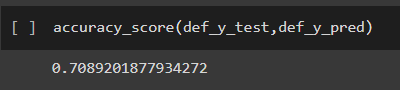

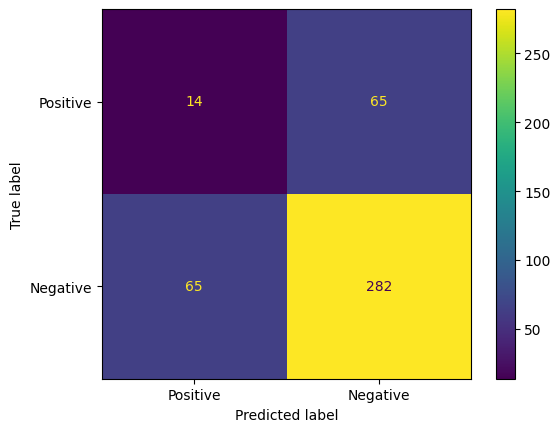

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
def_disp_cm = ConfusionMatrixDisplay(
    confusion_matrix=confusion_matrix(def_y_test,def_y_pred),
    display_labels=['Positive','Negative']
)
def_disp_cm.plot()
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


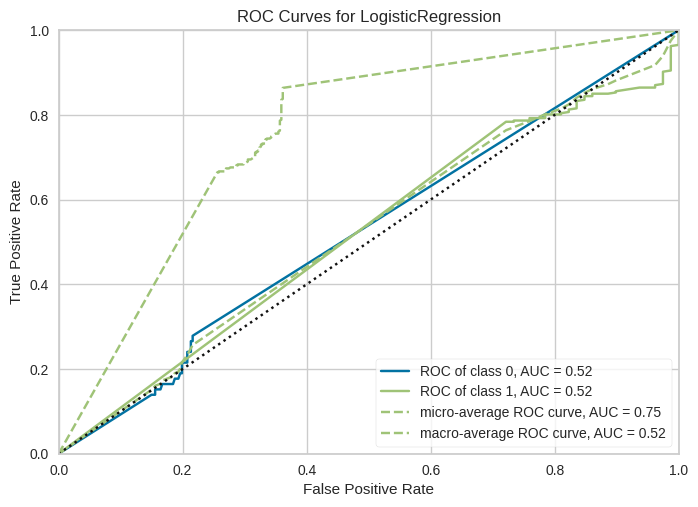

<Axes: title={'center': 'ROC Curves for LogisticRegression'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [ ]:
from yellowbrick.classifier import ROCAUC
def_logreg_roc = ROCAUC(def_lr)

def_logreg_roc.fit(def_X_train, def_y_train)
def_logreg_roc.score(def_X_test, def_y_test)
def_logreg_roc.poof()

## Deep Neural Networks: (0.7-0.8 acc)

In [ ]:
def_DNN = keras.Sequential([
    layers.Dense(128, activation='relu',input_shape = [19401]),
    layers.Dense(128, activation = 'relu'),
    layers.Dense(1, activation = 'sigmoid'),
])

In [ ]:
def_DNN.compile(
    optimizer='adam',
    loss = 'binary_crossentropy',
    metrics=['binary_accuracy'],
)
'''
  It measures the difference between the predicted probabilities of the model and the
    true labels, and produces a scalar value that is used to update the model
    parameters during training
'''
# loss = -(y * log(p) + (1-y) * log(1-p))

'\n  It measures the difference between the predicted probabilities of the model and the \n    true labels, and produces a scalar value that is used to update the model \n    parameters during training\n'

In [ ]:
def_early_stopping = keras.callbacks.EarlyStopping(
    patience=10, # how many epochs to wait before stopping
    min_delta=0.001, # minimium amount of change to count as an improvement
    restore_best_weights=True,
)

In [ ]:
def_history = def_DNN.fit(
    def_X_train, def_y_train,
    validation_data=(def_X_test, def_y_test),
    batch_size=512,
    epochs=1000,
    callbacks=[def_early_stopping],
    verbose=0,) # hide the output because we have so many epochs

Best Validation Loss: 323.7600
Best Validation Accuracy: 0.8333


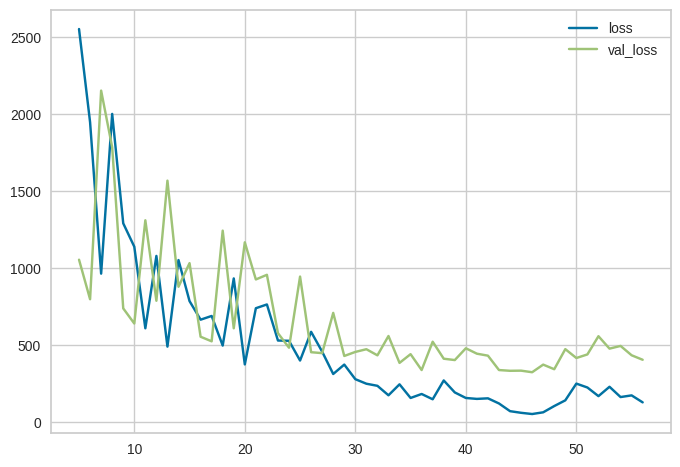

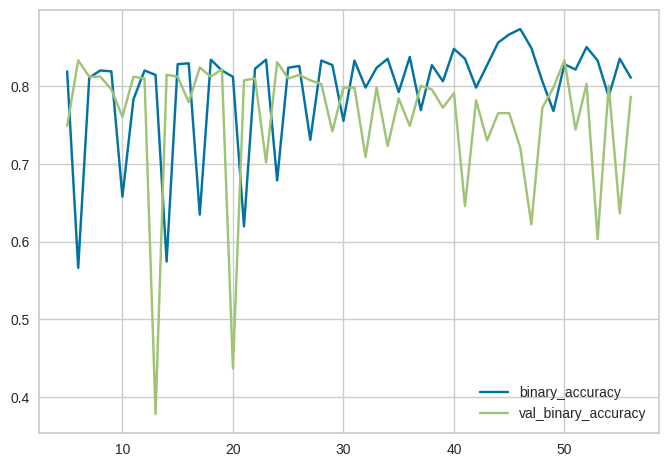

In [ ]:
def_history_df = pd.DataFrame(def_history.history)
# Start the plot at epoch 5
def_history_df.loc[5:, ['loss', 'val_loss']].plot()
def_history_df.loc[5:, ['binary_accuracy', 'val_binary_accuracy']].plot()

print(("Best Validation Loss: {:0.4f}" +\
      "\nBest Validation Accuracy: {:0.4f}")\
      .format(def_history_df['val_loss'].min(),
              def_history_df['val_binary_accuracy'].max()))

# SVM

In [ ]:
def_svc = SVC(random_state = 101)

In [ ]:
def_svm_acc = cross_val_score(def_svc,def_X_train,def_y_train,cv = 5)
def_svm_acc

array([0.82080925, 0.79768786, 0.81976744, 0.81976744, 0.81395349])

In [ ]:
print("Train score: ",np.mean(def_svm_acc))

Train score:  0.8143970963839227


In [ ]:
def_svc.fit(def_X_train,def_y_train)

SVC(random_state=101)

In [ ]:
def_svc_y_pred = def_svc.predict(def_X_test)
def_svc_y_pred

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [ ]:
accuracy_score(def_y_test,def_svc_y_pred)

0.812206572769953

In [ ]:
print("Test score:",def_svc.score(def_X_test,def_y_test))

Test score: 0.812206572769953


# PROPOSED METHODOLOGY

## Testing Between Pearson's and Spearman's Correlation:

In [ ]:
dfn_corr_spearman = df_n.corr(method = 'spearman')
dfn_corr_spearman

,ENSG00000000003,ENSG00000000005,ENSG00000000419,ENSG00000000457,ENSG00000000460,ENSG00000000938,ENSG00000000971,ENSG00000001036,ENSG00000001084,ENSG00000001167,...,ENSG00000283528,ENSG00000283536,ENSG00000283567,ENSG00000283594,ENSG00000283599,ENSG00000283632,ENSG00000283644,ENSG00000283654,ENSG00000283683,ENSG00000283697
ENSG00000000003,1.000000,0.471493,-0.034949,0.063167,-0.142000,0.065169,0.202529,-0.068719,0.161027,-0.028703,...,0.416943,0.068730,-0.112266,0.353091,-0.000152,-0.151920,-0.066379,0.052891,0.249328,0.007162
ENSG00000000005,0.471493,1.000000,-0.416870,-0.421634,-0.625961,0.408223,0.593708,-0.015733,0.266057,-0.464957,...,0.107548,0.006138,-0.081225,0.223139,-0.001464,-0.057076,0.008564,0.020025,0.745788,-0.237414
ENSG00000000419,-0.034949,-0.416870,1.000000,0.404731,0.583619,-0.118357,-0.242483,0.234816,-0.006844,0.537618,...,0.033215,0.003838,-0.032980,-0.093909,-0.024137,-0.058488,-0.208748,-0.028812,-0.369827,0.230060
ENSG00000000457,0.063167,-0.421634,0.404731,1.000000,0.838334,-0.315446,-0.463846,-0.188615,-0.122984,0.533942,...,0.287145,0.170080,-0.039092,0.045821,-0.063308,0.017935,0.125167,0.058739,-0.484795,0.369637
ENSG00000000460,-0.142000,-0.625961,0.583619,0.838334,1.000000,-0.214603,-0.493221,0.020475,-0.159060,0.621168,...,0.131955,0.091008,-0.029182,-0.181066,-0.051139,0.091765,0.048249,-0.022609,-0.614334,0.280709
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000283632,-0.151920,-0.057076,-0.058488,0.017935,0.091765,0.243037,0.162809,0.285855,-0.041098,0.043277,...,-0.073388,-0.149941,-0.011519,-0.219226,0.046836,1.000000,-0.139337,0.136500,-0.099473,0.120592
ENSG00000283644,-0.066379,0.008564,-0.208748,0.125167,0.048249,-0.034712,-0.172178,-0.278861,-0.128506,-0.065305,...,-0.002593,0.164269,0.119157,0.044213,0.021382,-0.139337,1.000000,-0.063241,0.010471,0.004437
ENSG00000283654,0.052891,0.020025,-0.028812,0.058739,-0.022609,0.054468,0.183599,0.110394,0.164057,0.095235,...,0.015998,-0.012269,-0.123077,0.013071,-0.147020,0.136500,-0.063241,1.000000,-0.077651,0.383825
ENSG00000283683,0.249328,0.745788,-0.369827,-0.484795,-0.614334,0.435079,0.605183,-0.023904,0.244644,-0.500412,...,-0.083527,0.011992,0.051386,0.163010,0.051030,-0.099473,0.010471,-0.077651,1.000000,-0.298123


In [ ]:
dfc_corr_spearman = df_c.corr(method = 'spearman')
dfc_corr_spearman

,ENSG00000000003,ENSG00000000005,ENSG00000000419,ENSG00000000457,ENSG00000000460,ENSG00000000938,ENSG00000000971,ENSG00000001036,ENSG00000001084,ENSG00000001167,...,ENSG00000283528,ENSG00000283536,ENSG00000283567,ENSG00000283594,ENSG00000283599,ENSG00000283632,ENSG00000283644,ENSG00000283654,ENSG00000283683,ENSG00000283697
ENSG00000000003,1.000000,0.211981,0.003375,0.083315,0.099585,0.110747,0.142865,-0.003143,0.083116,0.110306,...,0.221261,-0.009779,-0.084928,0.167050,0.061477,0.051182,-0.084624,0.034937,0.145888,-0.069596
ENSG00000000005,0.211981,1.000000,-0.280414,-0.091490,-0.226714,0.332396,0.371402,-0.158473,0.019984,-0.208870,...,0.091650,0.020678,-0.030506,0.234676,-0.037025,0.185536,0.060681,0.042975,0.305660,-0.075726
ENSG00000000419,0.003375,-0.280414,1.000000,0.135833,0.354400,0.023151,-0.073050,0.324219,0.080319,0.308484,...,0.023678,0.012991,-0.106734,-0.134391,0.081095,-0.119991,-0.187385,-0.044665,-0.198699,-0.015559
ENSG00000000457,0.083315,-0.091490,0.135833,1.000000,0.748947,-0.078018,-0.034187,-0.084699,0.033126,0.290001,...,0.124297,0.035520,-0.067646,-0.067565,-0.102104,0.037250,-0.016704,0.200752,-0.090413,0.190419
ENSG00000000460,0.099585,-0.226714,0.354400,0.748947,1.000000,-0.077392,-0.187411,0.097085,-0.045668,0.425198,...,0.043720,-0.007287,-0.014041,-0.215206,0.069140,-0.041176,-0.059429,-0.073700,-0.156675,0.006817
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000283632,0.051182,0.185536,-0.119991,0.037250,-0.041176,0.247858,0.189523,0.066895,-0.056708,-0.059962,...,0.053979,0.010699,-0.018502,-0.057237,0.045695,1.000000,-0.104629,0.094282,0.025068,0.150974
ENSG00000283644,-0.084624,0.060681,-0.187385,-0.016704,-0.059429,-0.083423,-0.044025,-0.217823,-0.034335,-0.074410,...,0.056297,0.096949,0.108841,0.007581,-0.044277,-0.104629,1.000000,-0.046139,0.020303,-0.027685
ENSG00000283654,0.034937,0.042975,-0.044665,0.200752,-0.073700,0.009335,0.181244,0.040784,0.231033,0.099865,...,0.048382,0.001211,-0.128331,0.052759,-0.225069,0.094282,-0.046139,1.000000,-0.090476,0.309712
ENSG00000283683,0.145888,0.305660,-0.198699,-0.090413,-0.156675,0.183385,0.195440,-0.112982,-0.073295,-0.240742,...,-0.021128,0.073127,0.054058,0.180478,0.061324,0.025068,0.020303,-0.090476,1.000000,-0.082905


### Filtering the Correlation matrix

In [ ]:
t = 0.7
gene_adj_df_c = ((t < dfc_corr_spearman) & (dfc_corr_spearman < 1)).astype(int)
gene_adj_df_n = ((t < dfn_corr_spearman) & (dfn_corr_spearman < 1)).astype(int)

## Correlation process (Pearson's)

In [ ]:
df_n_corr = df_n.corr()
df_n_corr

,ENSG00000000003,ENSG00000000005,ENSG00000000419,ENSG00000000457,ENSG00000000460,ENSG00000000938,ENSG00000000971,ENSG00000001036,ENSG00000001084,ENSG00000001167,...,ENSG00000283528,ENSG00000283536,ENSG00000283567,ENSG00000283594,ENSG00000283599,ENSG00000283632,ENSG00000283644,ENSG00000283654,ENSG00000283683,ENSG00000283697
ENSG00000000003,1.000000,0.149803,-0.057363,0.040271,-0.112852,0.000525,0.152624,-0.039944,0.105922,-0.051193,...,0.365137,0.055276,0.086253,0.287420,-0.104479,-0.101636,-0.178667,-0.025137,0.018900,-0.120157
ENSG00000000005,0.149803,1.000000,-0.205675,-0.325256,-0.345678,0.287924,0.492052,-0.005447,0.232323,-0.304815,...,-0.140972,-0.066667,-0.042776,-0.055526,-0.047157,-0.006028,-0.046500,-0.060299,0.621634,-0.164933
ENSG00000000419,-0.057363,-0.205675,1.000000,0.276045,0.465701,-0.075791,-0.162899,0.283928,0.087053,0.390972,...,-0.026261,-0.049888,0.009296,-0.131242,0.202830,-0.046738,-0.270097,0.018385,-0.199584,0.141037
ENSG00000000457,0.040271,-0.325256,0.276045,1.000000,0.814530,-0.245867,-0.434738,-0.112148,0.007841,0.413174,...,0.216181,0.174608,0.011759,-0.030126,0.026769,0.021738,0.030447,0.059347,-0.361916,0.271169
ENSG00000000460,-0.112852,-0.345678,0.465701,0.814530,1.000000,-0.135054,-0.414595,0.067126,-0.042415,0.477933,...,0.059471,0.086767,0.027591,-0.192217,0.111001,0.072859,-0.032944,-0.044499,-0.342626,0.152820
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000283632,-0.101636,-0.006028,-0.046738,0.021738,0.072859,0.123821,0.097507,0.145696,-0.041875,0.024869,...,-0.093624,-0.152573,-0.006416,-0.167961,-0.046204,1.000000,-0.163114,0.134610,0.031010,0.264506
ENSG00000283644,-0.178667,-0.046500,-0.270097,0.030447,-0.032944,-0.095384,-0.120983,-0.249496,-0.219402,-0.163051,...,-0.110815,0.154828,0.030297,0.082599,-0.026973,-0.163114,1.000000,-0.127731,-0.027440,-0.046286
ENSG00000283654,-0.025137,-0.060299,0.018385,0.059347,-0.044499,-0.035969,0.094818,0.074237,0.137656,0.104742,...,-0.000295,-0.047432,-0.102133,-0.014413,0.096717,0.134610,-0.127731,1.000000,-0.039263,0.393942
ENSG00000283683,0.018900,0.621634,-0.199584,-0.361916,-0.342626,0.271221,0.519959,0.014528,0.269858,-0.340829,...,-0.218479,-0.093427,-0.019984,-0.105392,-0.041646,0.031010,-0.027440,-0.039263,1.000000,-0.199000


In [ ]:
df_n_corr.to_csv("normal_corr.csv")

In [ ]:
from google.colab import files
files.download('normal_corr.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
df_c_corr = df_c.corr()
df_c_corr

,ENSG00000000003,ENSG00000000005,ENSG00000000419,ENSG00000000457,ENSG00000000460,ENSG00000000938,ENSG00000000971,ENSG00000001036,ENSG00000001084,ENSG00000001167,...,ENSG00000283528,ENSG00000283536,ENSG00000283567,ENSG00000283594,ENSG00000283599,ENSG00000283632,ENSG00000283644,ENSG00000283654,ENSG00000283683,ENSG00000283697
ENSG00000000003,1.000000,0.065604,-0.015746,0.084321,0.110369,0.010943,0.077998,0.019489,0.084595,0.124230,...,0.171027,-0.039447,-0.014183,0.073688,-0.023073,0.082063,-0.111434,0.039884,-0.025684,-0.069208
ENSG00000000005,0.065604,1.000000,-0.088282,-0.151588,-0.138996,0.045555,0.174189,-0.049181,0.002660,0.001136,...,-0.058760,-0.028013,-0.001421,0.023799,-0.017587,-0.035720,0.056656,-0.083705,0.055651,-0.075365
ENSG00000000419,-0.015746,-0.088282,1.000000,0.057566,0.245623,-0.020210,-0.097129,0.290775,0.017057,0.123274,...,-0.045358,-0.044384,-0.050738,-0.102825,0.043002,-0.077578,-0.222559,-0.019363,0.002881,0.002993
ENSG00000000457,0.084321,-0.151588,0.057566,1.000000,0.664434,-0.107170,-0.117401,-0.052987,0.019290,0.116586,...,0.110713,0.037689,-0.038287,-0.073992,-0.000295,0.034127,-0.109922,0.165659,-0.047429,0.095763
ENSG00000000460,0.110369,-0.138996,0.245623,0.664434,1.000000,-0.093696,-0.214335,0.123734,-0.026722,0.257095,...,0.048503,-0.000355,-0.009475,-0.131950,0.042690,-0.063563,-0.092004,-0.094294,-0.058633,-0.048012
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000283632,0.082063,-0.035720,-0.077578,0.034127,-0.063563,0.152923,0.082061,-0.003181,-0.035825,-0.017522,...,0.003545,0.011137,-0.032756,-0.053243,-0.038437,1.000000,-0.122116,0.042317,0.040656,0.093997
ENSG00000283644,-0.111434,0.056656,-0.222559,-0.109922,-0.092004,-0.094466,-0.074213,-0.211798,-0.132686,-0.083938,...,-0.022169,0.075156,0.107680,0.037467,-0.028074,-0.122116,1.000000,-0.152669,-0.008765,-0.109182
ENSG00000283654,0.039884,-0.083705,-0.019363,0.165659,-0.094294,-0.035978,0.089448,0.039429,0.159964,-0.021137,...,0.016104,-0.014873,-0.102242,0.116212,-0.009365,0.042317,-0.152669,1.000000,0.014554,0.275186
ENSG00000283683,-0.025684,0.055651,0.002881,-0.047429,-0.058633,0.022770,0.082137,-0.017678,0.137047,-0.020553,...,-0.047928,-0.019008,-0.009302,-0.007298,-0.011500,0.040656,-0.008765,0.014554,1.000000,-0.041575


In [ ]:
df_c_corr.to_csv("cancer_corr.csv")

### Filtering the correlation matrix

In [ ]:
t = 0.9
gene_adj_df_c = ((t < df_c_mod_corr) & (df_c_mod_corr < 1)).astype(int)
gene_adj_df_n = ((t < df_n_mod_corr) & (df_n_mod_corr < 1)).astype(int)

In [ ]:
gene_unstack_df_c = gene_adj_df_c.unstack()
gene_unstack_df_c = gene_unstack_df_c[gene_unstack_df_c > 0]

gene_unstack_df_n = gene_adj_df_n.unstack()
gene_unstack_df_n = gene_unstack_df_n[gene_unstack_df_n > 0]

In [ ]:
gene_df_n = gene_unstack_df_n.to_frame().reset_index()
gene_df_n = gene_df_n.rename(columns= {0: 'score','level_1': 'G2','level_0': 'G1'})

gene_df_c = gene_unstack_df_c.to_frame().reset_index()
gene_df_c = gene_df_c.rename(columns= {0: 'score','level_1': 'G2','level_0': 'G1'})

In [ ]:
gene_df_n.to_csv("t_9_normal_gene.csv")
gene_df_c.to_csv("t_9_cancer_gene.csv")

ALL DONE IN JUPYTER NB "Normal_patient corr "

## Making Graphs using gene correlation

In [ ]:
gene_df_n = pd.read_csv("t_9_normal_gene.csv")
gene_df_n = gene_df_n.drop(['Unnamed: 0'],axis=1)


gene_df_c = pd.read_csv("t_9_cancer_gene.csv")
gene_df_c = gene_df_c.drop(['Unnamed: 0'],axis=1)

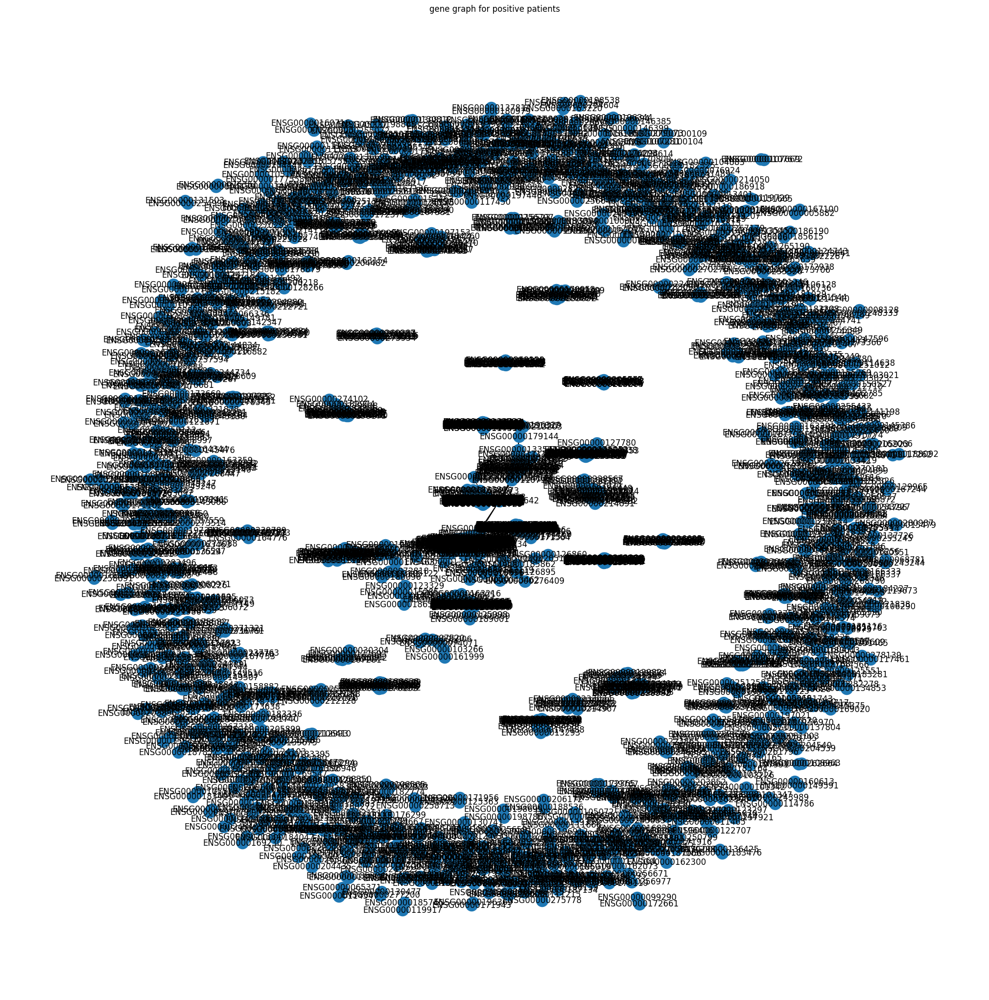

In [ ]:
plt.figure(figsize=(20,20))
Graph_df_c = nx.from_pandas_edgelist(gene_df_c,"G1","G2",create_using=nx.Graph())
nx.draw(Graph_df_c,with_labels=True)
plt.title("gene graph for positive patients")
plt.show()

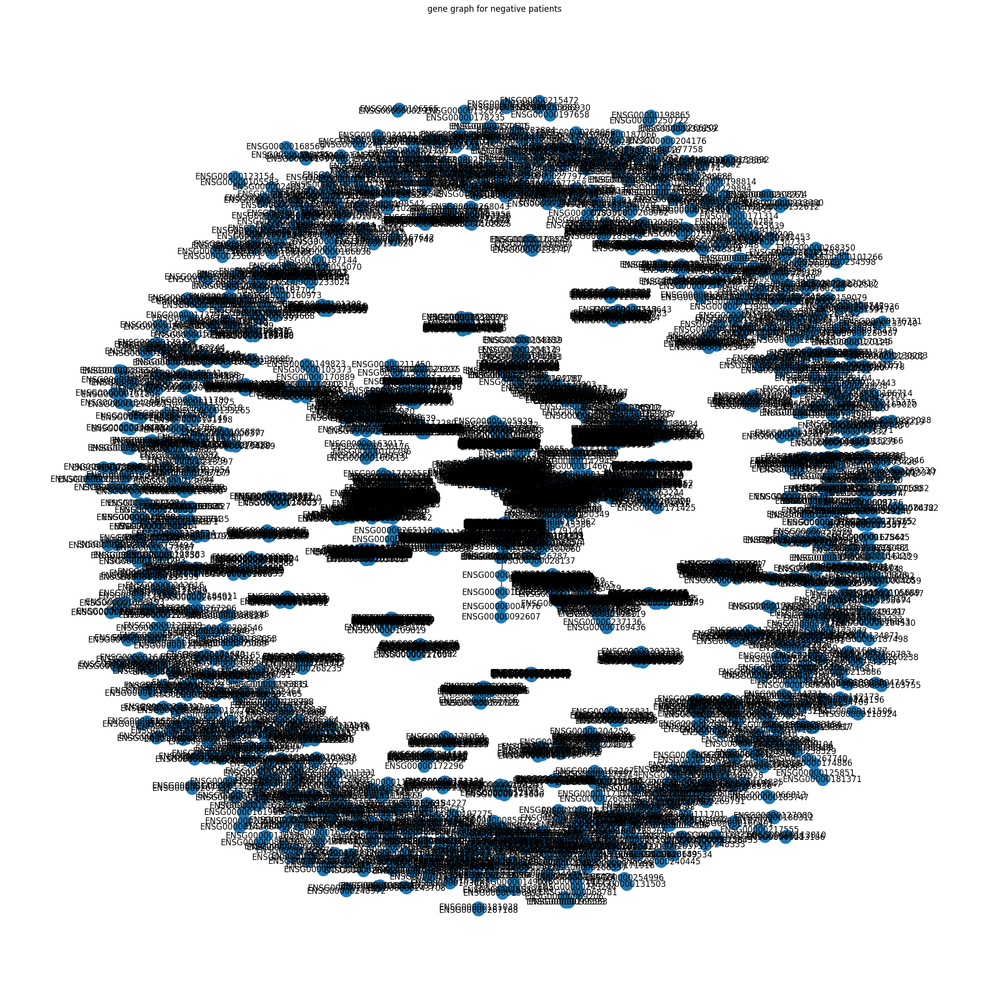

In [ ]:
plt.figure(figsize=(20,20))
Graph_df_n = nx.from_pandas_edgelist(gene_df_n,"G1","G2",create_using=nx.Graph())
nx.draw(Graph_df_n,with_labels=True)
plt.title("gene graph for negative patients")
plt.show()

## Pre-processing the Graph for DeepWalk

In [ ]:
a = [i for i in range(Graph_df_c.number_of_nodes())]
b = [n for n in Graph_df_c.nodes()]
d_df_c = {b[i]:a[i] for i in range(Graph_df_c.number_of_nodes())}
d_df_c

{'ENSG00000001630': 0,
 'ENSG00000240720': 1,
 'ENSG00000002745': 2,
 'ENSG00000027644': 3,
 'ENSG00000075429': 4,
 'ENSG00000152954': 5,
 'ENSG00000162992': 6,
 'ENSG00000163497': 7,
 'ENSG00000177511': 8,
 'ENSG00000002933': 9,
 'ENSG00000106565': 10,
 'ENSG00000004059': 11,
 'ENSG00000106328': 12,
 'ENSG00000004139': 13,
 'ENSG00000076351': 14,
 'ENSG00000004700': 15,
 'ENSG00000121350': 16,
 'ENSG00000005810': 17,
 'ENSG00000283208': 18,
 'ENSG00000005812': 19,
 'ENSG00000102805': 20,
 'ENSG00000005882': 21,
 'ENSG00000167100': 22,
 'ENSG00000005981': 23,
 'ENSG00000006788': 24,
 'ENSG00000010282': 25,
 'ENSG00000068976': 26,
 'ENSG00000070808': 27,
 'ENSG00000077009': 28,
 'ENSG00000077522': 29,
 'ENSG00000078328': 30,
 'ENSG00000081248': 31,
 'ENSG00000086967': 32,
 'ENSG00000091482': 33,
 'ENSG00000092054': 34,
 'ENSG00000092529': 35,
 'ENSG00000100628': 36,
 'ENSG00000101306': 37,
 'ENSG00000101470': 38,
 'ENSG00000101605': 39,
 'ENSG00000101892': 40,
 'ENSG00000104848': 41,
 '

In [ ]:
c = [i for i in range(Graph_df_n.number_of_nodes())] #-> creates an array[0->121]
d = [n for n in Graph_df_n.nodes()]
d_df_n = {d[i]:c[i] for i in range(Graph_df_n.number_of_nodes())}
d_df_n

{'ENSG00000000938': 0,
 'ENSG00000147443': 1,
 'ENSG00000000971': 2,
 'ENSG00000244414': 3,
 'ENSG00000001630': 4,
 'ENSG00000240720': 5,
 'ENSG00000002726': 6,
 'ENSG00000172969': 7,
 'ENSG00000185038': 8,
 'ENSG00000002834': 9,
 'ENSG00000263874': 10,
 'ENSG00000002919': 11,
 'ENSG00000108439': 12,
 'ENSG00000159111': 13,
 'ENSG00000002933': 14,
 'ENSG00000106565': 15,
 'ENSG00000003756': 16,
 'ENSG00000004534': 17,
 'ENSG00000004059': 18,
 'ENSG00000106328': 19,
 'ENSG00000004139': 20,
 'ENSG00000076351': 21,
 'ENSG00000004776': 22,
 'ENSG00000092607': 23,
 'ENSG00000102683': 24,
 'ENSG00000005102': 25,
 'ENSG00000147113': 26,
 'ENSG00000173269': 27,
 'ENSG00000198844': 28,
 'ENSG00000005249': 29,
 'ENSG00000056998': 30,
 'ENSG00000092445': 31,
 'ENSG00000095637': 32,
 'ENSG00000108960': 33,
 'ENSG00000118804': 34,
 'ENSG00000119927': 35,
 'ENSG00000120049': 36,
 'ENSG00000121691': 37,
 'ENSG00000122729': 38,
 'ENSG00000131471': 39,
 'ENSG00000132170': 40,
 'ENSG00000132837': 41,
 '

In [ ]:
mod_gene_df_c = gene_df_c.copy() #gene_df_c
mod_gene_df_n = gene_df_n.copy()

In [ ]:

for i in range(mod_gene_df_c.shape[0]):
  mod_gene_df_c.iloc[i,0] = d_df_c[mod_gene_df_c.iloc[i,0]]
  mod_gene_df_c.iloc[i,1] = d_df_c[mod_gene_df_c.iloc[i,1]]


'''
for i in range(mod_gene_df_c.shape[0]):
  print(mod_gene_df_c.iloc[i,0])#print(i)
'''

'\nfor i in range(mod_gene_df_c.shape[0]):\n  print(mod_gene_df_c.iloc[i,0])#print(i)\n'

In [ ]:
mod_gene_df_c

,G1,G2,score
0,0,1,1
1,2,3,1
2,2,4,1
3,2,5,1
4,2,6,1
...,...,...,...
34506,1892,1891,1
34507,1536,1535,1
34508,253,251,1
34509,253,252,1


In [ ]:
for i in range(mod_gene_df_n.shape[0]):
  mod_gene_df_n.iloc[i,0] = d_df_n[mod_gene_df_n.iloc[i,0]]
  mod_gene_df_n.iloc[i,1] = d_df_n[mod_gene_df_n.iloc[i,1]]

In [ ]:
mod_gene_df_n

,G1,G2,score
0,0,1,1
1,2,3,1
2,4,5,1
3,6,7,1
4,6,8,1
...,...,...,...
74857,1272,1268,1
74858,1272,1269,1
74859,1272,1270,1
74860,631,630,1


In [ ]:
mod_gene_df_n.to_csv("modified_t_9_normal_gene.csv")
mod_gene_df_c.to_csv("modified_t_9_cancer_gene.csv")

### Making the Graphs Out of Modified Genes

 **Run this if u have the modified files:**

In [ ]:
mod_gene_df_n = pd.read_csv("modified_t_9_normal_gene.csv")
mod_gene_df_n = mod_gene_df_n.drop(['Unnamed: 0'],axis=1)


mod_gene_df_c = pd.read_csv("modified_t_9_cancer_gene.csv")
mod_gene_df_c = mod_gene_df_c.drop(['Unnamed: 0'],axis=1)

In [ ]:
mod_gene_df_c

,G1,G2,score
0,0,1,1
1,2,3,1
2,2,4,1
3,2,5,1
4,2,6,1
...,...,...,...
34506,1892,1891,1
34507,1536,1535,1
34508,253,251,1
34509,253,252,1


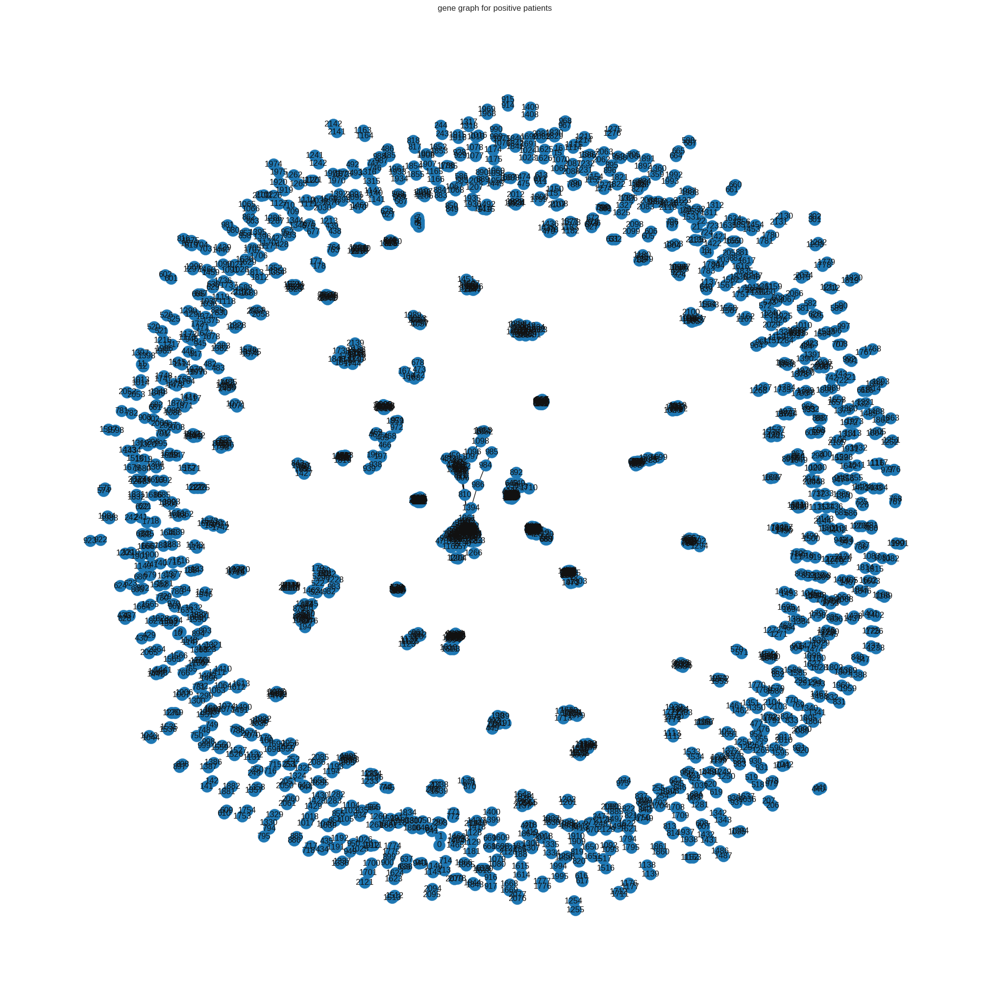

In [ ]:
plt.figure(figsize=(20,20))
Graph2_df_c = nx.from_pandas_edgelist(mod_gene_df_c,"G1","G2",create_using=nx.Graph())
nx.draw(Graph2_df_c,with_labels=True)
plt.title("gene graph for positive patients")
plt.show()

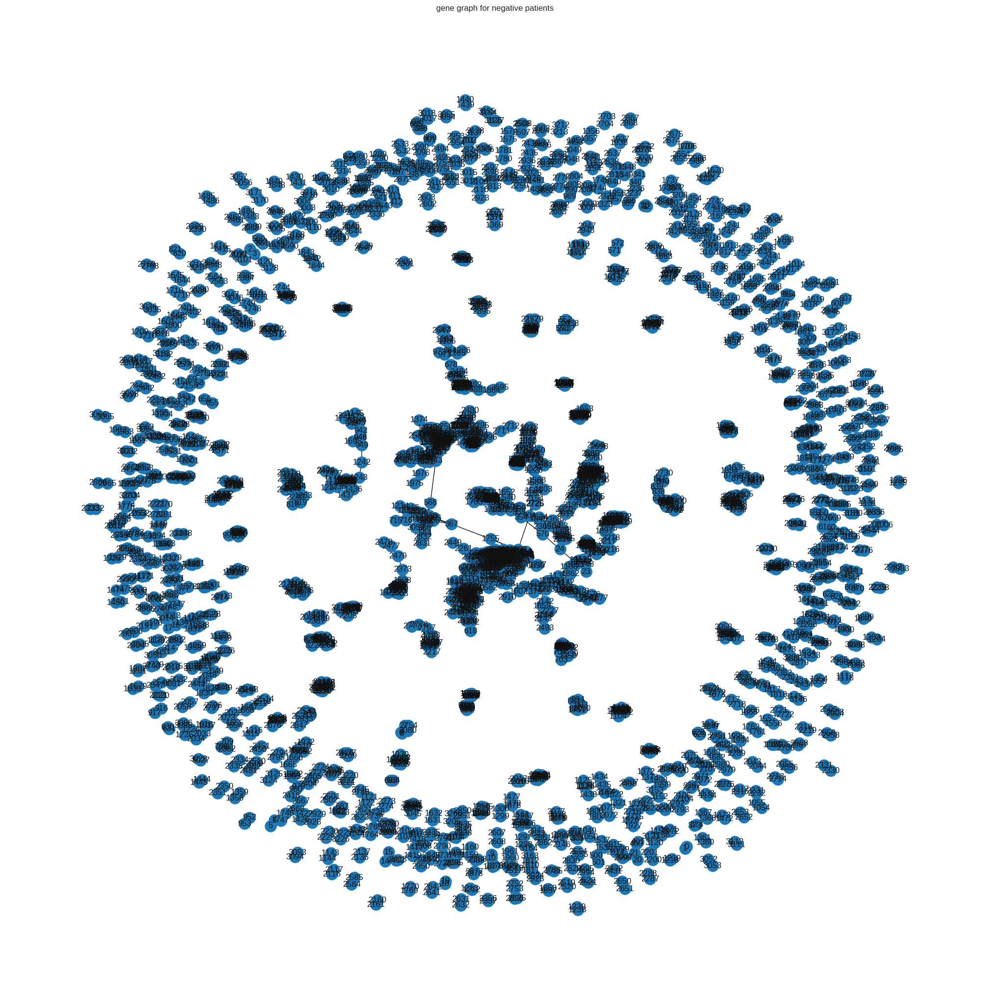

In [ ]:
plt.figure(figsize=(20,20))
Graph2_df_n = nx.from_pandas_edgelist(mod_gene_df_n,"G1","G2",create_using=nx.Graph())
nx.draw(Graph2_df_n,with_labels=True)
plt.title("gene graph for negative patients")
plt.show()

In [ ]:
Graph2_df_c.number_of_nodes()

2145

In [ ]:
Graph2_df_n.number_of_nodes()

3228

In [ ]:
t1 = [i for i in range(Graph2_df_c.number_of_nodes())] #check for gg_df0 and gg_df1
t2 = [i for i in Graph2_df_c.nodes()]
t1==t2

True

## DEEPWALK

**Deepwalk features:**


---


*walk_number*: The walk_number parameter in DeepWalk determines the number of random walks to be generated from each node in the graph.

# ***Higher walk_number:***

More diverse context: Generating more random walks for each node can increase the diversity of the context in which a node appears

Improved embedding quality

**NOTE:** large or has complex relationships between nodes, a larger value of walk_number (e.g., 50-100 or more) may be necessary to capture enough diversity.

---

*walk_length*: The walk_length parameter in DeepWalk determines the maximum length of a random walk generated from each node in the graph

# ***Higher walk_length:***

Local vs. global information: Shorter random walks (walk_length is small) tend to capture more local information, while longer random walks (walk_length is large) tend to capture more global information about the graph. Thus, shorter random walks may be more effective in capturing node-level information, while longer random walks may be more effective in capturing graph-level information.

Overfitting - Longer walk_length

Computation time - Longer walk_length

**NOTE:** If the graph is small and dense, shorter walk_length values may be more effective at capturing local structure and diversity, as there may be many highly interconnected regions in the graph.


---

# ***Higher dimensions:***

Expressiveness: Increasing embedding_size allows for more expressive representations of nodes in the graph

Dimensionality reduction: In some cases, reducing embedding_size can improve the quality of the embeddings by reducing overfitting and noise. This is particularly true when dealing with high-dimensional or noisy data.

Computational complexity

**NOTE:** larger embedding_size values (e.g., 128 or 256) are more effective at capturing diverse information about the graph, as they allow for more expressive representations of nodes in the graph. However, larger embedding_size values also increase the computational complexity of the training process and the memory requirements for storing the embeddings.

---

*window_size*:The window_size hyperparameter in DeepWalk determines the size of the window used to sample node pairs during the Skip-gram training process. Specifically, for each node in a random walk sequence, the window_size parameter defines the maximum distance between the current node and the nodes that are used to predict its context.

# ***Window_Size***

**NOTE:** larger window_size values (e.g., 10-20) are more effective at capturing global information about the graph, as they consider a wider range of nodes in the graph. This can be useful for capturing diversity in large and complex graphs. However, larger window_size values also increase the computational complexity of the training process.

---

*min_count:*The min_count hyperparameter in DeepWalk specifies the minimum number of times a node must appear in the random walk sequences for it to be included in the vocabulary and to have an embedding learned for it. Nodes that appear less frequently than the min_count threshold are discarded and not considered during the training process.

# ***Min_Count***

Higher min_count discards rare nodes which can help reduce the noise in the embeddings and improve their quality. However, setting min_count too high can also result in loss of important nodes and decrease the diversity captured in the embeddings.

It also reduces Computational complexity

**NOTE:** a lower min_count value (e.g., 1-5) can help capture more diverse information about the graph, as it includes more nodes in the vocabulary and considers nodes that may be less frequent.

---



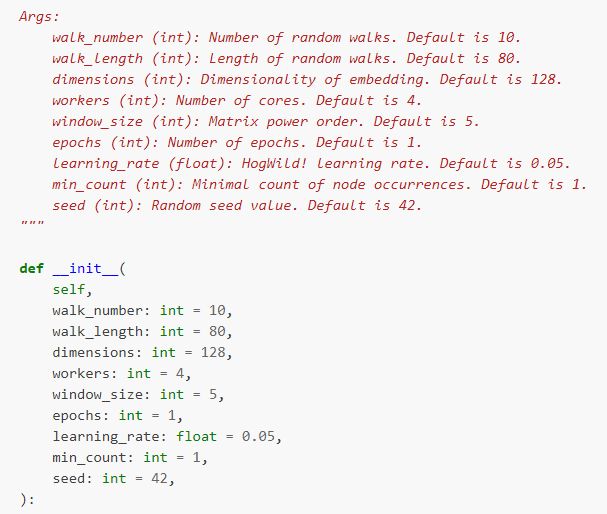

In [ ]:
Dp_df_c = DeepWalk(walk_number = 25,
                   walk_length = 35,
                   dimensions = 50,
                   window_size = 5,
                   epochs = 10,
                   learning_rate = 0.05,
                   min_count = 2,
                   seed = 42)
Dp_df_n = DeepWalk(walk_number = 25,walk_length = 35,dimensions = 50, window_size = 5, epochs = 10, learning_rate = 0.05, min_count = 2, seed = 42)

#Walk_number in the middle of 20-30 is sufficient or even 10
#Walk_length in the middle of 30-40 is sufficient
#Min count in 1-5 is sufficient

In [ ]:
Dp_df_c.fit(Graph2_df_c)

In [ ]:
Dp_df_n.fit(Graph2_df_n)

In [ ]:
em_df_c = Dp_df_c.get_embedding()
em_df_c.shape

(2145, 50)

In [ ]:
em_df_n = Dp_df_n.get_embedding()
em_df_n.shape

(3228, 50)

## Preparing the dataset from the network embedding

In [ ]:
f = ['x'+str(i) for i in range(em_df_n.shape[1])]
print(f)

['x0', 'x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'x11', 'x12', 'x13', 'x14', 'x15', 'x16', 'x17', 'x18', 'x19', 'x20', 'x21', 'x22', 'x23', 'x24', 'x25', 'x26', 'x27', 'x28', 'x29', 'x30', 'x31', 'x32', 'x33', 'x34', 'x35', 'x36', 'x37', 'x38', 'x39', 'x40', 'x41', 'x42', 'x43', 'x44', 'x45', 'x46', 'x47', 'x48', 'x49']


In [ ]:
final_df_n_from_em = pd.DataFrame(data = em_df_n,columns = f)
final_df_n_from_em['target'] = 0
final_df_n_from_em

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,x41,x42,x43,x44,x45,x46,x47,x48,x49,target
0,-0.130531,0.226891,1.302994,1.266077,1.954234,0.398154,1.201438,-3.223137,-0.679319,0.625870,...,0.689073,-0.507376,0.358028,0.275202,1.364949,0.003349,1.527554,0.994514,-0.740113,0
1,0.738612,1.051192,1.675774,0.403442,1.374804,0.417186,1.098506,-2.339187,0.415540,-0.467174,...,-0.047604,-0.893651,-0.373351,0.592149,0.136352,-0.114044,1.206152,1.630157,0.272293,0
2,-0.371842,1.076943,1.145421,-1.233629,0.409104,0.540464,-2.241599,0.629618,2.095540,1.091613,...,-1.152897,-0.634485,-0.882019,1.201859,-0.217782,1.230364,1.645516,-0.855272,1.693030,0
3,-0.489403,1.500055,0.769671,-1.307323,0.406837,-0.249974,-1.614961,-0.080158,1.202499,0.649356,...,-1.062529,-0.050501,-1.421792,1.532854,-0.467210,1.213790,2.136040,-0.043925,1.268711,0
4,0.506868,-0.235677,1.528343,0.832131,-0.356070,-0.919928,-1.482399,-0.771410,0.473397,0.511220,...,0.340337,-0.239498,-1.556744,1.875761,1.071146,0.122437,2.245791,0.275499,0.717884,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3223,-0.630520,0.195446,1.365950,-1.562260,1.216402,-0.362679,-0.480016,-0.178368,-0.796312,0.333458,...,1.295223,-0.585131,1.121226,1.255073,-0.061435,0.815812,0.580358,-2.388691,-1.344153,0
3224,0.119350,0.431466,1.671367,-1.515990,-0.094570,1.726062,-2.743876,0.020580,1.148773,-1.996284,...,0.141568,-1.377941,1.308870,0.406201,-1.221963,-0.117405,0.338254,-0.230406,-1.043645,0
3225,-0.251486,0.712493,0.268408,-1.146610,0.595892,0.069831,-0.949081,-0.737151,-0.682604,-1.123946,...,0.525802,-1.173490,1.535120,0.558159,0.252579,1.341655,0.805762,-1.914295,-1.409429,0
3226,0.597056,0.007520,0.686485,0.357347,1.467439,-0.589659,-1.053834,-0.023118,1.192130,0.182059,...,0.472269,-1.071786,-1.901801,0.921716,0.572354,-0.494488,1.100401,0.453197,0.775512,0


In [ ]:
final_df_c_from_em = pd.DataFrame(data = em_df_c, columns = f)
final_df_c_from_em['target'] = 1
final_df_c_from_em

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,x41,x42,x43,x44,x45,x46,x47,x48,x49,target
0,-0.478702,0.215161,-0.200727,-0.564539,-0.225819,0.719971,-1.315707,-1.335427,-1.736990,-0.534351,...,1.486657,-0.035175,-0.142884,0.260853,0.429102,-1.140665,-0.518451,0.551470,-0.596422,1
1,-1.340155,0.493847,-0.317364,-1.513149,-0.546049,-0.446486,0.142743,0.755779,-1.012400,-0.529000,...,0.711197,2.215769,-0.083202,-0.560294,0.806225,-0.526235,0.501376,-0.004305,0.165717,1
2,-0.688765,0.145865,1.305706,0.670076,-0.517980,0.863928,-0.790544,0.836552,-0.434901,-0.346621,...,1.437560,-0.460582,-0.792938,-0.382001,-0.992182,-0.519915,-0.089134,-0.802848,1.412895,1
3,-0.906204,0.147665,2.308906,1.188479,-1.249713,1.296267,0.359658,0.431003,0.170886,-0.668896,...,0.420874,-0.827572,-0.254107,-0.951353,0.028207,-0.494750,0.869680,-1.182464,1.704900,1
4,-0.506821,0.316081,1.168850,0.414792,-0.304886,0.783688,-0.613103,0.989579,-0.434314,-0.366587,...,1.698368,-0.544884,-0.755062,-0.268820,-0.867018,-0.980347,-0.306630,-0.619196,1.794558,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2140,0.928748,-1.034269,1.165859,-0.724572,1.324775,-0.208737,-0.707218,-1.099177,0.338219,0.383775,...,0.433303,-0.566741,-0.551086,0.151702,0.236949,0.149411,0.328515,0.286659,1.134300,1
2141,-0.366014,0.030861,0.253873,0.179918,-1.274538,1.329184,1.101759,-0.708726,1.222411,0.029358,...,-0.530221,-0.810242,0.268957,0.159772,0.042341,0.018629,-0.999557,-0.012565,-0.872337,1
2142,-0.874230,-0.088493,-0.022811,0.394972,-1.518162,1.192891,1.029506,0.000591,1.516732,-0.623401,...,-0.385283,-0.675634,-0.366245,-0.637495,0.203444,-0.472800,-0.871755,0.084036,-0.792862,1
2143,-0.054199,-0.624175,-0.599823,0.711821,-1.077203,1.014149,-0.279577,0.529593,0.776201,-1.410162,...,-1.322724,1.474657,0.221297,1.080709,0.943038,-0.476364,-0.880625,-0.568461,-1.699274,1


In [ ]:
final_df = pd.concat([final_df_c_from_em,final_df_n_from_em],axis = 0)
final_df = final_df.reset_index()
final_df = final_df.drop(['index'],axis=1)
final_df

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,x41,x42,x43,x44,x45,x46,x47,x48,x49,target
0,-0.478702,0.215161,-0.200727,-0.564539,-0.225819,0.719971,-1.315707,-1.335427,-1.736990,-0.534351,...,1.486657,-0.035175,-0.142884,0.260853,0.429102,-1.140665,-0.518451,0.551470,-0.596422,1
1,-1.340155,0.493847,-0.317364,-1.513149,-0.546049,-0.446486,0.142743,0.755779,-1.012400,-0.529000,...,0.711197,2.215769,-0.083202,-0.560294,0.806225,-0.526235,0.501376,-0.004305,0.165717,1
2,-0.688765,0.145865,1.305706,0.670076,-0.517980,0.863928,-0.790544,0.836552,-0.434901,-0.346621,...,1.437560,-0.460582,-0.792938,-0.382001,-0.992182,-0.519915,-0.089134,-0.802848,1.412895,1
3,-0.906204,0.147665,2.308906,1.188479,-1.249713,1.296267,0.359658,0.431003,0.170886,-0.668896,...,0.420874,-0.827572,-0.254107,-0.951353,0.028207,-0.494750,0.869680,-1.182464,1.704900,1
4,-0.506821,0.316081,1.168850,0.414792,-0.304886,0.783688,-0.613103,0.989579,-0.434314,-0.366587,...,1.698368,-0.544884,-0.755062,-0.268820,-0.867018,-0.980347,-0.306630,-0.619196,1.794558,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5368,-0.630520,0.195446,1.365950,-1.562260,1.216402,-0.362679,-0.480016,-0.178368,-0.796312,0.333458,...,1.295223,-0.585131,1.121226,1.255073,-0.061435,0.815812,0.580358,-2.388691,-1.344153,0
5369,0.119350,0.431466,1.671367,-1.515990,-0.094570,1.726062,-2.743876,0.020580,1.148773,-1.996284,...,0.141568,-1.377941,1.308870,0.406201,-1.221963,-0.117405,0.338254,-0.230406,-1.043645,0
5370,-0.251486,0.712493,0.268408,-1.146610,0.595892,0.069831,-0.949081,-0.737151,-0.682604,-1.123946,...,0.525802,-1.173490,1.535120,0.558159,0.252579,1.341655,0.805762,-1.914295,-1.409429,0
5371,0.597056,0.007520,0.686485,0.357347,1.467439,-0.589659,-1.053834,-0.023118,1.192130,0.182059,...,0.472269,-1.071786,-1.901801,0.921716,0.572354,-0.494488,1.100401,0.453197,0.775512,0


In [ ]:
final_df.to_csv("compressed_deepwalk_dataset.csv")

## Preparing the ML Model

### Logistic Regression

In [ ]:
X = final_df.iloc[:,:-1]
X

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,x40,x41,x42,x43,x44,x45,x46,x47,x48,x49
0,-0.478702,0.215161,-0.200727,-0.564539,-0.225819,0.719971,-1.315707,-1.335427,-1.736990,-0.534351,...,0.143356,1.486657,-0.035175,-0.142884,0.260853,0.429102,-1.140665,-0.518451,0.551470,-0.596422
1,-1.340155,0.493847,-0.317364,-1.513149,-0.546049,-0.446486,0.142743,0.755779,-1.012400,-0.529000,...,-0.028984,0.711197,2.215769,-0.083202,-0.560294,0.806225,-0.526235,0.501376,-0.004305,0.165717
2,-0.688765,0.145865,1.305706,0.670076,-0.517980,0.863928,-0.790544,0.836552,-0.434901,-0.346621,...,0.937867,1.437560,-0.460582,-0.792938,-0.382001,-0.992182,-0.519915,-0.089134,-0.802848,1.412895
3,-0.906204,0.147665,2.308906,1.188479,-1.249713,1.296267,0.359658,0.431003,0.170886,-0.668896,...,0.366431,0.420874,-0.827572,-0.254107,-0.951353,0.028207,-0.494750,0.869680,-1.182464,1.704900
4,-0.506821,0.316081,1.168850,0.414792,-0.304886,0.783688,-0.613103,0.989579,-0.434314,-0.366587,...,0.976413,1.698368,-0.544884,-0.755062,-0.268820,-0.867018,-0.980347,-0.306630,-0.619196,1.794558
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5368,-0.630520,0.195446,1.365950,-1.562260,1.216402,-0.362679,-0.480016,-0.178368,-0.796312,0.333458,...,3.247965,1.295223,-0.585131,1.121226,1.255073,-0.061435,0.815812,0.580358,-2.388691,-1.344153
5369,0.119350,0.431466,1.671367,-1.515990,-0.094570,1.726062,-2.743876,0.020580,1.148773,-1.996284,...,0.362795,0.141568,-1.377941,1.308870,0.406201,-1.221963,-0.117405,0.338254,-0.230406,-1.043645
5370,-0.251486,0.712493,0.268408,-1.146610,0.595892,0.069831,-0.949081,-0.737151,-0.682604,-1.123946,...,2.952444,0.525802,-1.173490,1.535120,0.558159,0.252579,1.341655,0.805762,-1.914295,-1.409429
5371,0.597056,0.007520,0.686485,0.357347,1.467439,-0.589659,-1.053834,-0.023118,1.192130,0.182059,...,0.558096,0.472269,-1.071786,-1.901801,0.921716,0.572354,-0.494488,1.100401,0.453197,0.775512


In [ ]:
y = final_df.iloc[:,-1]
y

0       1
1       1
2       1
3       1
4       1
       ..
5368    0
5369    0
5370    0
5371    0
5372    0
Name: target, Length: 5373, dtype: int64

In [ ]:
X_train,X_test,y_train,y_test = train_test_split(X,y,random_state = 10,test_size = 0.33,shuffle = True)

In [ ]:
X_test

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,x40,x41,x42,x43,x44,x45,x46,x47,x48,x49
3077,-1.818696,2.272562,1.349843,-1.238098,-0.874710,0.261858,-0.954929,1.186482,2.146906,0.308130,...,0.754333,0.302657,-0.533414,0.364903,-1.625001,-0.661683,-0.572266,-0.665872,-1.594864,0.798111
4912,0.229680,-1.016215,-0.014087,-0.090017,-0.193235,-0.366087,2.199490,-0.017648,-0.523178,-1.792894,...,-0.220991,0.880543,-1.859931,-0.893274,-1.205800,0.073579,-1.109971,-2.362938,-0.843643,1.832998
3951,0.550937,0.680811,-0.501884,-0.186752,-1.181441,1.174755,1.601725,-0.632129,-1.641299,0.289475,...,-1.178925,-1.565297,0.117189,-0.257853,1.313497,-1.244862,0.129316,1.256919,0.167542,0.591149
1723,-0.384306,-2.776687,0.316332,-1.920680,1.265609,1.014349,0.716918,1.000692,-0.882493,-0.517220,...,0.076125,0.579551,-1.096394,1.362781,0.971353,-0.488966,-0.078025,-0.438751,-0.043882,-2.940621
4861,-0.668556,-0.735218,0.025275,0.322506,-0.127481,0.632287,1.359514,-0.863999,0.523537,-0.458924,...,1.363494,0.177073,-1.943499,0.120759,-1.305304,-0.625535,-1.353998,1.220208,0.906891,1.608081
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
652,0.112564,-2.114754,0.757985,0.572338,-0.065837,0.485796,1.772954,-2.177599,-1.414450,-0.145210,...,-0.756572,1.457561,-1.120263,-0.907062,-0.024580,-1.317641,-0.151915,-0.877812,-1.021467,-1.889975
4475,0.505955,0.836990,-0.423667,-0.416871,1.418182,1.073965,-0.037876,-1.239257,1.201659,-0.586195,...,-0.252919,0.353893,-1.728650,1.139733,-0.074802,0.459518,1.256099,0.257670,0.793013,0.133396
5124,-0.860012,-0.681390,0.361968,0.130034,1.446832,-0.013388,-0.481990,-1.964234,-0.598909,-0.998940,...,0.483880,-0.211779,0.389398,0.265915,0.063757,-0.822725,-0.404699,0.528712,0.310536,1.624254
2493,-1.192074,-0.570983,0.191264,-0.508835,-0.435987,0.245923,-0.316081,-0.448495,0.510184,-0.369975,...,-0.476105,0.072962,-0.433565,0.070972,0.500265,0.750917,-0.513721,0.020853,-1.443100,0.169776


In [ ]:
y_test

3077    0
4912    0
3951    0
1723    1
4861    0
       ..
652     1
4475    0
5124    0
2493    0
4343    0
Name: target, Length: 1774, dtype: int64

In [ ]:
lr = LogisticRegression(random_state = 5)
lr.fit(X_train,y_train)

LogisticRegression(random_state=5)

In [ ]:
y_pred = lr.predict(X_test)
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
len(y_pred)

1774

In [ ]:
accuracy_score(y_test,y_pred)

0.9881623449830891

Test case: split = 0.33, e = 10, dimension = 100  [0.9949267192784668]

Test case: split = 0.33, e = 10, dimension = 100  [0.9966178128523112]

Test case: split = 0.33, e = 10, dimension = 50, min_count = 2, walk_length = 35, walk_number = 25 [0.9915445321307779]
[0.9836527621195039]

In [ ]:
confusion_matrix(y_test,y_pred)

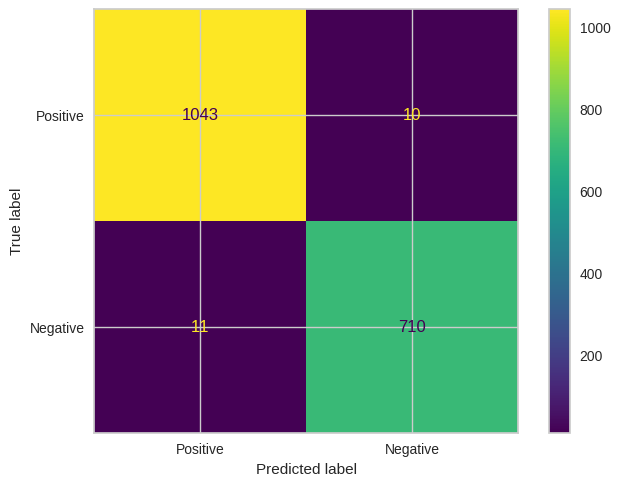

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
disp_cm = ConfusionMatrixDisplay(
    confusion_matrix=confusion_matrix(y_test,y_pred),
    display_labels=['Positive','Negative']
)
disp_cm.plot()
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


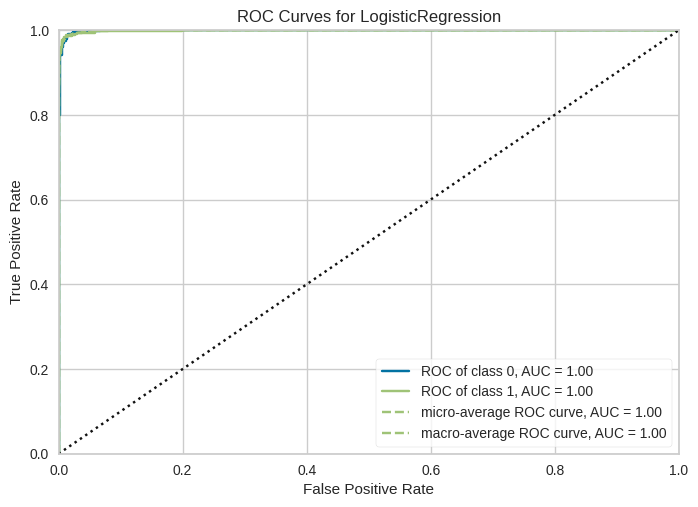

<Axes: title={'center': 'ROC Curves for LogisticRegression'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [ ]:
from yellowbrick.classifier import ROCAUC
logreg_roc = ROCAUC(lr)

logreg_roc.fit(X_train, y_train)
logreg_roc.score(X_test, y_test)
logreg_roc.poof()

### Deep Neural Network

In [ ]:
DNN = keras.Sequential([
    layers.Dense(128, activation='relu',input_shape = [50]), #standard nodes -> 128 -> acc -> 0.9
    layers.Dense(128, activation = 'relu'),
    layers.Dense(1, activation = 'sigmoid'),
])

In [ ]:
DNN.compile(
    optimizer='adam', #replacement to ordinary stochastic gradient descent function
    loss = 'binary_crossentropy',
    metrics=['binary_accuracy'],
)
'''
  It measures the difference between the predicted probabilities of the model and the
    true labels, and produces a scalar value that is used to update the model
    parameters during training
'''
# loss = -(y * log(p) + (1-y) * log(1-p))

'\n  It measures the difference between the predicted probabilities of the model and the \n    true labels, and produces a scalar value that is used to update the model \n    parameters during training\n'

In [ ]:
early_stopping = keras.callbacks.EarlyStopping(
    patience=10, # how many epochs to wait before stopping
    min_delta=0.001, # minimium amount of change to count as an improvement
    restore_best_weights=True,
)

In [ ]:
history = DNN.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    batch_size=512,
    epochs=1000,
    callbacks=[early_stopping],
    verbose=0,) # hide the output because we have so many epochs

Best Validation Loss: 0.0322
Best Validation Accuracy: 0.9887


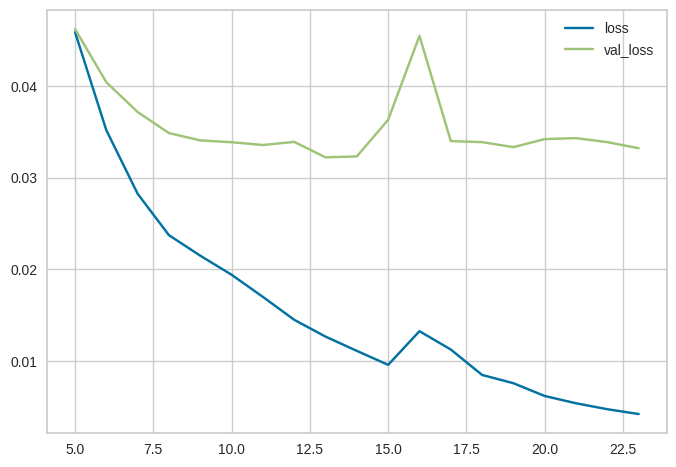

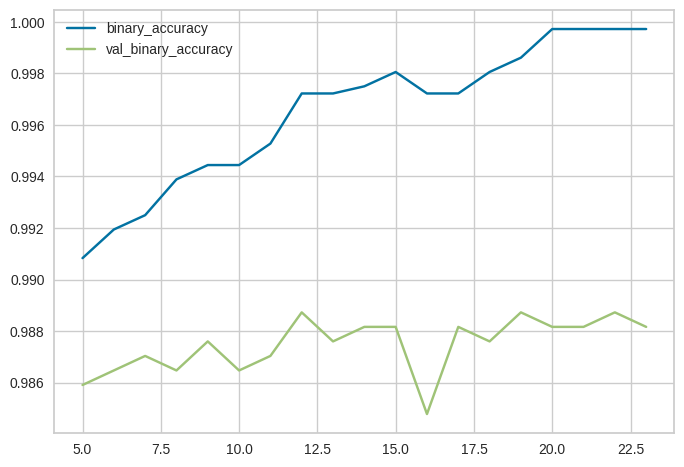

In [ ]:
history_df = pd.DataFrame(history.history)
# Start the plot at epoch 5
history_df.loc[5:, ['loss', 'val_loss']].plot()
history_df.loc[5:, ['binary_accuracy', 'val_binary_accuracy']].plot()

print(("Best Validation Loss: {:0.4f}" +\
      "\nBest Validation Accuracy: {:0.4f}")\
      .format(history_df['val_loss'].min(),
              history_df['val_binary_accuracy'].max()))

In [ ]:
history_df.columns

Index(['loss', 'binary_accuracy', 'val_loss', 'val_binary_accuracy'], dtype='object')

SVM

In [ ]:
svc = SVC(random_state = 100)

In [ ]:
svm_acc = cross_val_score(svc,X_train,y_train,cv=5)
svm_acc

array([0.99861111, 0.99722222, 0.99444444, 0.99305556, 0.99582754])

In [ ]:
print("Train score: ",np.mean(svm_acc))

Train score:  0.9958321743161799


In [ ]:
svc.fit(X_train,y_train)

SVC(random_state=100)

In [ ]:
svm_y_pred = svc.predict(X_test)
svm_y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
accuracy_score(y_test,svm_y_pred)

0.9943630214205186

In [ ]:
print("test score: ",svc.score(X_test,y_test))

test score:  0.9943630214205186


# Test Scenario

In [ ]:
import pandas as pd


In [ ]:
url = "https://archive.ics.uci.edu/ml/machine-learning-databases/iris/iris.data"

df = pd.read_csv(url, names=['sepal length', 'sepal width' , 'petal lenght', 'petal width', 'target'])
df

,sepal length,sepal width,petal lenght,petal width,target
0,5.1,3.5,1.4,0.2,Iris-setosa
1,4.9,3.0,1.4,0.2,Iris-setosa
2,4.7,3.2,1.3,0.2,Iris-setosa
3,4.6,3.1,1.5,0.2,Iris-setosa
4,5.0,3.6,1.4,0.2,Iris-setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,Iris-virginica
146,6.3,2.5,5.0,1.9,Iris-virginica
147,6.5,3.0,5.2,2.0,Iris-virginica
148,6.2,3.4,5.4,2.3,Iris-virginica


In [ ]:
df.T

In [ ]:
from sklearn.preprocessing import StandardScaler

features = ['sepal length', 'sepal width', 'petal lenght', 'petal width']

X1 = df.loc[:, features].values

y1 = df.loc[:, ['target']].values

X1 = StandardScaler().fit_transform(X1)

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components= 2)
pri_com = pca.fit_transform(X1)
pri_df = pd.DataFrame(data = pri_com,columns=['PC1','PC2'])
pri_df

,PC1,PC2
0,-2.264542,0.505704
1,-2.086426,-0.655405
2,-2.367950,-0.318477
3,-2.304197,-0.575368
4,-2.388777,0.674767
...,...,...
145,1.870522,0.382822
146,1.558492,-0.905314
147,1.520845,0.266795
148,1.376391,1.016362


In [ ]:
new_df = pd.concat([pri_df,df['target']],axis=1)
new_df

,PC1,PC2,target
0,-2.264542,0.505704,Iris-setosa
1,-2.086426,-0.655405,Iris-setosa
2,-2.367950,-0.318477,Iris-setosa
3,-2.304197,-0.575368,Iris-setosa
4,-2.388777,0.674767,Iris-setosa
...,...,...,...
145,1.870522,0.382822,Iris-virginica
146,1.558492,-0.905314,Iris-virginica
147,1.520845,0.266795,Iris-virginica
148,1.376391,1.016362,Iris-virginica


In [ ]:
new_X1 = new_df.iloc[:,:-1]
new_y1 = new_df.iloc[:,-1]
new_X1

,PC1,PC2
0,-2.264542,0.505704
1,-2.086426,-0.655405
2,-2.367950,-0.318477
3,-2.304197,-0.575368
4,-2.388777,0.674767
...,...,...
145,1.870522,0.382822
146,1.558492,-0.905314
147,1.520845,0.266795
148,1.376391,1.016362


In [ ]:
new_y1

0         Iris-setosa
1         Iris-setosa
2         Iris-setosa
3         Iris-setosa
4         Iris-setosa
            ...      
145    Iris-virginica
146    Iris-virginica
147    Iris-virginica
148    Iris-virginica
149    Iris-virginica
Name: target, Length: 150, dtype: object

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

X1_train,X1_test,y1_train,y1_test = train_test_split(new_X1,new_y1,test_size=0.3,random_state = 1)

lr = LogisticRegression(random_state = 2)
lr.fit(X1_train,y1_train)

LogisticRegression(random_state=2)

In [ ]:
y1_pred = lr.predict(X1_test)
y1_pred

array(['Iris-setosa', 'Iris-versicolor', 'Iris-versicolor', 'Iris-setosa',
       'Iris-virginica', 'Iris-versicolor', 'Iris-virginica',
       'Iris-setosa', 'Iris-setosa', 'Iris-virginica', 'Iris-versicolor',
       'Iris-setosa', 'Iris-virginica', 'Iris-versicolor',
       'Iris-versicolor', 'Iris-setosa', 'Iris-versicolor',
       'Iris-versicolor', 'Iris-setosa', 'Iris-setosa', 'Iris-versicolor',
       'Iris-versicolor', 'Iris-virginica', 'Iris-setosa',
       'Iris-virginica', 'Iris-versicolor', 'Iris-setosa', 'Iris-setosa',
       'Iris-versicolor', 'Iris-virginica', 'Iris-versicolor',
       'Iris-virginica', 'Iris-versicolor', 'Iris-virginica',
       'Iris-virginica', 'Iris-setosa', 'Iris-versicolor', 'Iris-setosa',
       'Iris-virginica', 'Iris-virginica', 'Iris-virginica',
       'Iris-setosa', 'Iris-virginica', 'Iris-virginica',
       'Iris-versicolor'], dtype=object)

In [ ]:
from sklearn.metrics import confusion_matrix,accuracy_score,roc_auc_score

In [ ]:
cm = confusion_matrix(y1_test,y1_pred)
cm

array([[14,  0,  0],
       [ 0, 16,  2],
       [ 0,  0, 13]])

In [ ]:
from mlxtend.plotting import plot_confusion_matrix
fig, ax = plot_confusion_matrix(conf_mat=cm, figsize=(6, 6), cmap=plt.cm.Greens)
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

In [ ]:
logreg=accuracy_score(y1_test,y1_pred)
logreg

0.9555555555555556

In [ ]:
df

,sepal length,sepal width,petal lenght,petal width,target
0,5.1,3.5,1.4,0.2,Iris-setosa
1,4.9,3.0,1.4,0.2,Iris-setosa
2,4.7,3.2,1.3,0.2,Iris-setosa
3,4.6,3.1,1.5,0.2,Iris-setosa
4,5.0,3.6,1.4,0.2,Iris-setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,Iris-virginica
146,6.3,2.5,5.0,1.9,Iris-virginica
147,6.5,3.0,5.2,2.0,Iris-virginica
148,6.2,3.4,5.4,2.3,Iris-virginica


In [ ]:
df['target'].unique()

array(['Iris-setosa', 'Iris-versicolor', 'Iris-virginica'], dtype=object)

In [ ]:
df['target'].value_counts()

Iris-setosa        50
Iris-versicolor    50
Iris-virginica     50
Name: target, dtype: int64

In [ ]:
df_is = df.query("target == 'Iris-setosa'")
df_iv = df.query("target == 'Iris-versicolor'")
df_ivi = df.query("target == 'Iris-virginica'")

In [ ]:
is_x = df_is.loc[:,features]
is_y = df_is.iloc[:,-1]

iv_x = df_iv.loc[:,features]
iv_y = df_iv.iloc[:,-1]

ivi_x = df_ivi.loc[:,features]
ivi_y = df_ivi.iloc[:,-1]

In [ ]:
Is_SS = StandardScaler()
Iv_SS = StandardScaler()
Ivi_SS = StandardScaler()

In [ ]:
S_is_x = Is_SS.fit_transform(is_x)
S_iv_x = Iv_SS.fit_transform(iv_x)
S_ivi_x = Ivi_SS.fit_transform(ivi_x)

In [ ]:
pca1 = PCA(n_components= 2)

In [ ]:

PC_is = pca1.fit_transform(S_is_x)
PC_is_df = pd.DataFrame(data = PC_is,columns=['PC1','PC2'])
PC_is_df['target'] = 'Iris-setosa'
PC_is_df

,PC1,PC2,target
0,-0.015913,0.643205,Iris-setosa
1,-1.133779,-0.109118,Iris-setosa
2,-1.378461,0.309457,Iris-setosa
3,-1.285597,-0.681934,Iris-setosa
4,-0.033325,0.656913,Iris-setosa
5,2.522933,-0.744840,Iris-setosa
6,-0.644297,-0.433195,Iris-setosa
7,-0.132907,0.042973,Iris-setosa
8,-2.149160,-0.708925,Iris-setosa
9,-1.156197,0.087708,Iris-setosa


In [ ]:
pca2 = PCA(n_components= 2)

In [ ]:
PC_iv = pca2.fit_transform(S_iv_x)


PC_iv_df = pd.DataFrame(data = PC_iv,columns=['PC1','PC2'])


PC_iv_df['target'] = 'Iris-versicolor'
PC_iv_df.head()

,PC1,PC2,target
0,-2.348153,0.523792,Iris-versicolor
1,-1.815237,-0.469936,Iris-versicolor
2,-2.597170,0.608159,Iris-versicolor
3,1.482044,0.362836,Iris-versicolor
4,-1.425975,0.581866,Iris-versicolor


In [ ]:
pca3 = PCA(n_components= 2)

In [ ]:
PC_ivi = pca3.fit_transform(S_ivi_x)


PC_ivi_df = pd.DataFrame(data = PC_ivi,columns=['PC1','PC2'])


PC_ivi_df['target'] = 'Iris-virginica'
PC_ivi_df.head()

,PC1,PC2,target
0,-1.388563,-1.444334,Iris-virginica
1,1.744896,-0.213496,Iris-virginica
2,-0.950266,0.410126,Iris-virginica
3,0.651989,0.489924,Iris-virginica
4,-0.469932,-0.323172,Iris-virginica


In [ ]:
final_df = pd.concat([PC_is_df,PC_iv_df,PC_ivi_df],axis=0)
final_df

,PC1,PC2,target
0,-0.015913,0.643205,Iris-setosa
1,-1.133779,-0.109118,Iris-setosa
2,-1.378461,0.309457,Iris-setosa
3,-1.285597,-0.681934,Iris-setosa
4,-0.033325,0.656913,Iris-setosa
...,...,...,...
45,-0.190823,-0.900111,Iris-virginica
46,1.703067,0.327098,Iris-virginica
47,0.431914,-0.310081,Iris-virginica
48,-0.547584,-1.637816,Iris-virginica


In [ ]:
final_df = final_df.reset_index()

In [ ]:
final_df = final_df.drop(['index'],axis=1)
final_df

,PC1,PC2,target
0,-0.015913,0.643205,Iris-setosa
1,-1.133779,-0.109118,Iris-setosa
2,-1.378461,0.309457,Iris-setosa
3,-1.285597,-0.681934,Iris-setosa
4,-0.033325,0.656913,Iris-setosa
...,...,...,...
145,-0.190823,-0.900111,Iris-virginica
146,1.703067,0.327098,Iris-virginica
147,0.431914,-0.310081,Iris-virginica
148,-0.547584,-1.637816,Iris-virginica


In [ ]:
'''
final_df = final_df.sample(frac=1)
final_df
'''
X2 = final_df.iloc[:,:-1]
y2 = final_df.iloc[:,-1]
X2

,PC1,PC2
0,-0.015913,0.643205
1,-1.133779,-0.109118
2,-1.378461,0.309457
3,-1.285597,-0.681934
4,-0.033325,0.656913
...,...,...
145,-0.190823,-0.900111
146,1.703067,0.327098
147,0.431914,-0.310081
148,-0.547584,-1.637816


In [ ]:
y2

0         Iris-setosa
1         Iris-setosa
2         Iris-setosa
3         Iris-setosa
4         Iris-setosa
            ...      
145    Iris-virginica
146    Iris-virginica
147    Iris-virginica
148    Iris-virginica
149    Iris-virginica
Name: target, Length: 150, dtype: object

In [ ]:
X2_train,X2_test,y2_train,y2_test = train_test_split(X2,y2,test_size=0.3,random_state = 10,shuffle = True)

lr2 = LogisticRegression(random_state = 20)
lr2.fit(X2_train,y2_train)

LogisticRegression(random_state=20)

In [ ]:
y2_pred = lr2.predict(X2_test)
y2_pred

array(['Iris-setosa', 'Iris-setosa', 'Iris-setosa', 'Iris-virginica',
       'Iris-setosa', 'Iris-setosa', 'Iris-setosa', 'Iris-setosa',
       'Iris-setosa', 'Iris-virginica', 'Iris-virginica',
       'Iris-virginica', 'Iris-setosa', 'Iris-virginica', 'Iris-setosa',
       'Iris-virginica', 'Iris-virginica', 'Iris-virginica',
       'Iris-virginica', 'Iris-setosa', 'Iris-setosa', 'Iris-virginica',
       'Iris-setosa', 'Iris-virginica', 'Iris-virginica', 'Iris-setosa',
       'Iris-virginica', 'Iris-setosa', 'Iris-setosa', 'Iris-virginica',
       'Iris-setosa', 'Iris-virginica', 'Iris-setosa', 'Iris-virginica',
       'Iris-setosa', 'Iris-virginica', 'Iris-virginica',
       'Iris-virginica', 'Iris-setosa', 'Iris-virginica',
       'Iris-virginica', 'Iris-virginica', 'Iris-virginica',
       'Iris-virginica', 'Iris-virginica'], dtype=object)

In [ ]:
accuracy_score(y2_test,y2_pred)

0.3111111111111111

In [ ]:
confusion_matrix(y2_test,y2_pred)

array([[6, 0, 8],
       [8, 0, 9],
       [6, 0, 8]])